<a href="https://colab.research.google.com/github/Dawoon-Jeong0523/Product-Science/blob/main/Phylogenetic_Tree_insitution_JEE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import math
from tqdm.notebook import tqdm
from numpy import dot
from numpy.linalg import norm
import networkx as nx
from numpy import dot
from numpy.linalg import norm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from networkx.algorithms.community import greedy_modularity_communities
import networkx as nx
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from math import pi
from matplotlib.path import Path
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D
import pydot
from networkx.drawing.nx_pydot import graphviz_layout
from matplotlib import cm
from collections import Counter
import re
import matplotlib as mpl

input_directory=r"C:\Users\jdwoo\Desktop\Python\Drivers of Insitutional Evolution\Data"
output_directory=r"C:\Users\jdwoo\Desktop\Python\Drivers of Insitutional Evolution\Output"

In [ ]:
class Product():
  def __init__(self,id:int, name:str, year:int, raw_gene:list):
    self.id=id
    self.name=name
    self.year=year
    self.raw_gene=raw_gene
    self.genotype=None
    self.taxon=None
    self.ancestor=None
    self.descendant=None
    self.ancestors=None
    self.descendants=None

class TAXON():
  def __init__(self,id:int, name:str, year:int):
    self.id=id
    self.name=name
    self.year=year
    self.representative=None
    self.genes=None
    self.products=None
    self.genotype=None
    self.ancestor=None
    self.descendant=None
    self.ancestors=None
    self.descendants=None
    self.representative_vector=None

    self.Inertia=None
    self.pressure=None

class TreeNode():
  def __init__(self,input_taxon):
      self.taxon = input_taxon
      self.child = None
      self.pos=(None,None)

class Tree():
  def __init__(self, root: TreeNode) -> None:
      self.root = root
      self.pos={}
      self.count=0
  def visit(self, node: TreeNode, depth:int) -> None:
      #print("--"*depth, node.taxon.name)
      print("--"*depth, node.taxon.representative)
      self.pos[node]=(depth,self.count*10)
      self.count+=1
  def __DFT_preorderHelp(self, curNode, depth:int)->None:
      #base case
      if curNode ==None:
          return
      self.visit(curNode, depth)

      #child
      for childNode in curNode.child :
          self.__DFT_preorderHelp(childNode, depth+1)


  def DFT_preorder(self) -> None:
      self.__DFT_preorderHelp(self.root, 0)

class Product():
  def __init__(self,id:int, name:str, year:int, raw_gene:list):
    self.id=id
    self.name=name
    self.year=year
    self.raw_gene=raw_gene
    self.genotype=None
    self.taxon=None
    self.ancestor=None
    self.descendant=None
    self.ancestors=None
    self.descendants=None
    self.nation=re.sub('[^a-zA-Z]',"",name)

In [ ]:
def cosine_similarity(A,B):
  return dot(A, B)/(norm(A)*norm(B))

def jaccard_similarity(A,B):
  temp_count=0
  for i in range(len(A)):
    if A[i]==B[i]:
      temp_count+=1
  return temp_count/len(A)

def Ancestor_Descendant_Single_adjacent_year(descendant_taxon,taxa_list):
  if descendant_taxon.year==min([taxon.year for taxon in taxa_list]):
    return None

  else:
    temp_list=[]
    temp_taxa_list=[]
    for taxon in taxa_list:
      if taxon.year==descendant_taxon.year-1:
        #temp_list.append(cosine_similarity(taxon.representative_vector,descendant_taxon.representative_vector))
        temp_list.append(jaccard_similarity(taxon.representative_vector,descendant_taxon.representative_vector))

        temp_taxa_list.append(taxon)
      else:
        temp_list.append(-1)
        temp_taxa_list.append(taxon)
    return temp_taxa_list[temp_list.index(max(temp_list))]

# default // input_layout = dot inverse
# input_layout_dict = {
    #'spring': nx.spring_layout(G),
    #'spectral':nx.spectral_layout(G),
    #'shell':nx.shell_layout(G),
    #'circular':nx.circular_layout(G),
    #'kamada_kawai':nx.kamada_kawai_layout(G),
    #'random':nx.random_layout(G),
    #'neato':graphviz_layout(G, prog="neato",root='root'),
    #"twopi":graphviz_layout(G, prog="twopi",root='root'),
    #"dot":graphviz_layout(G, prog="dot",root='root'),
    #"fdp":graphviz_layout(G, prog="fdp",root='root'),
    #"sfdp":graphviz_layout(G, prog="sfdp",root='root'),
    #"circo":graphviz_layout(G, prog="circo",root='root')}

def phylogenetic_tree_Single(input_G,input_Node_list,input_style,input_lw,input_temp_title,name_mode,input_labels_list):
  pos1=graphviz_layout(input_G, prog="dot",root='root')
  temp_pos=pos1
  pos1={}
  for key in list(temp_pos.keys()):
    pos1[key]=[0,0]
    pos1[key][0]=(temp_pos[key][0])
    pos1[key][1]=(-temp_pos[key][1])
  fig = plt.figure(figsize=(50,50))
  ax=plt.subplot(111)
  nx.draw_networkx_nodes(input_G,pos=pos1,node_color="red",alpha=0.5,node_size=0)
  #nx.draw_networkx_nodes(input_G,pos=pos1,node_color="red",nodelist=["root"],alpha=1)

  """
  for temp_child in input_Node_list[0].child:
    temp_edge=(input_Node_list[0].taxon.name,temp_child.taxon.name)
    ax.annotate("",
              xy=(pos1[temp_child.taxon.name][0],pos1[temp_child.taxon.name][1]),
              xytext=(pos1[input_Node_list[0].taxon.name][0],pos1[input_Node_list[0].taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="red",
                            alpha=jaccard_similarity(text_model.genotype,temp_child.taxon.representative_vector)

                            )

                  )
    ax.annotate("",
              xy=(pos1[temp_child.taxon.name][0],pos1[temp_child.taxon.name][1]),
              xytext=(pos1[input_Node_list[0].taxon.name][0],pos1[input_Node_list[0].taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="blue",
                            alpha=jaccard_similarity(zero_model.genotype,temp_child.taxon.representative_vector)

                            )

                  )


    ax.plot([pos1[input_Node_list[0].taxon.name][0],pos1[temp_child.taxon.name][0]],
                  [pos1[input_Node_list[0].taxon.name][1],pos1[temp_child.taxon.name][1]],
                  color="red")

    nx.draw_networkx_edges(input_G,
                           pos=pos1,
                           alpha=1,
                           edgelist=[temp_edge],
                           width=20,
                           arrows=False,
                           edge_color="red")
    """

  # root node이외의 선조 후손 관계 연결
  for node in input_Node_list:
    if node.taxon.name!="root":
      if node.taxon.descendants:
        for descendant in node.taxon.descendants:
          temp_edge=(node.taxon.name,descendant.name)
          ax.annotate("",
              xy=(pos1[descendant.name][0],pos1[descendant.name][1]),
              xytext=(pos1[node.taxon.name][0],pos1[node.taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="red",
                            alpha=jaccard_similarity(text_model.genotype,descendant.representative_vector)
                            #alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector)

                            #alpha=1
                            #alpha=Gower_similarity(node.taxon.representative_vector,descendant.representative_vector,Cat_list)
                            )
                  )
          ax.annotate("",
              xy=(pos1[descendant.name][0],pos1[descendant.name][1]),
              xytext=(pos1[node.taxon.name][0],pos1[node.taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="blue",
                            alpha=jaccard_similarity(zero_model.genotype,descendant.representative_vector)
                            #alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector)

                            #alpha=1
                            #alpha=Gower_similarity(node.taxon.representative_vector,descendant.representative_vector,Cat_list)
                            )
                  )

          """
          nx.draw_networkx_edges(input_G,
                             pos=pos1,
                             #alpha=cosine_similarity(node.taxon.representative_vector,descendant.representative_vector),
                             alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector),
                             edgelist=[temp_edge],
                             width=20,
                             arrows=False,
                             connectionstyle="arc3,rad=1",
                             #arrowstyle="wedge",
                             edge_color="red",
                             node_size=0)
          """


  # year axis
  root_year=int(Node_list[0].taxon.year)
  final_year=int(Node_list[-1].taxon.year)

  year_list=[year for year in range(root_year,final_year+1)]
  temp_y_min=min([pos1[key][1] for key in list(pos1.keys())])
  temp_y_max=max([pos1[key][1] for key in list(pos1.keys())])
  temp_y_list=sorted(list(set([pos1[key][1] for key in list(pos1.keys())])))

  temp_x_min=min([pos1[key][0] for key in list(pos1.keys())])
  temp_x_max=max([pos1[key][0] for key in list(pos1.keys())])
  temp_x_list=sorted(list(set([pos1[key][0] for key in list(pos1.keys())])))


  ax.vlines(temp_x_max*1.1,temp_y_min,temp_y_max)
  for i in range(len(year_list[1:])):
    ax.text(
        temp_x_max*1.1,
        temp_y_list[i+1],
        #temp_y_min+(i+1)*((temp_y_max-temp_y_min)/len(year_list)),
        year_list[i+1],
        fontsize=40
    )

  ax.spines["top"].set_visible(False)
  ax.spines["left"].set_visible(False)
  ax.spines["right"].set_visible(False)
  ax.spines["bottom"].set_visible(False)

  #plt.grid(True, axis='y', color='gray', alpha=0.5, linestyle='--')


  # color bar


  # labeling
  if name_mode:
    for node in input_Node_list:
      if node.taxon.name!="root":
        ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.name,rotation=30,fontsize=40)

    plt.tight_layout()
    plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_200_wo_label.jpg",dpi=200,transparent=True,bbox_inches="tight")
    plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_300_wo_label.jpg",dpi=300,transparent=True,bbox_inches="tight")

  else:
    # labeling
    for node in input_Node_list:
      if node.taxon.name!="root":

        # input_labels_list
        if node.taxon.name in input_labels_list:
          if node.taxon.year!=2019:
            #ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.representative,rotation=30,fontsize=20)
            ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],"O",rotation=30,fontsize=40)


          # end node
          if node.taxon.year==2019:
            #ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1]+1,re.sub("[^a-zA-Z, ]","",node.taxon.representative),rotation=30,fontsize=40)
            ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1]+1,taxon.representative,rotation=30,fontsize=40)


        # leaf node
        #if not node.taxon.descendants:
        #  ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.representative,rotation=30,fontsize=20)

    #pos1["root"][1]=pos1["root"][1]-50

    #nx.draw_networkx_labels(G,pos=pos1,labels={"root":"Root"},font_size=40,font_weight="bold")


  plt.tight_layout()
  plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_200_w_label.jpg",dpi=200,transparent=True,bbox_inches="tight")
  plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_300_w_label.jpg",dpi=300,transparent=True,bbox_inches="tight")


def evolutionary_trajectory(source_taxon,target_taxon):
  path1=[path for path in nx.all_simple_paths(G,source="root",target=source_taxon.name)][0]
  path2=[path for path in nx.all_simple_paths(G,source="root",target=target_taxon.name)][0]
  path1.reverse()

  temp_path=[]
  for item in path1:
    if item not in path2:
      temp_path.append(item)
    else:
      index=path2.index(item)
      break

  temp_path+=path2[index:]

  return temp_path

# default // input_layout = dot inverse
# input_layout_dict = {
    #'spring': nx.spring_layout(G),
    #'spectral':nx.spectral_layout(G),
    #'shell':nx.shell_layout(G),
    #'circular':nx.circular_layout(G),
    #'kamada_kawai':nx.kamada_kawai_layout(G),
    #'random':nx.random_layout(G),
    #'neato':graphviz_layout(G, prog="neato",root='root'),
    #"twopi":graphviz_layout(G, prog="twopi",root='root'),
    #"dot":graphviz_layout(G, prog="dot",root='root'),
    #"fdp":graphviz_layout(G, prog="fdp",root='root'),
    #"sfdp":graphviz_layout(G, prog="sfdp",root='root'),
    #"circo":graphviz_layout(G, prog="circo",root='root')}

def phylogenetic_tree_Single_GBR(input_G,input_Node_list,input_style,input_lw,input_temp_title,name_mode,input_labels_list):
  pos1=graphviz_layout(input_G, prog="dot",root='root')
  temp_pos=pos1
  pos1={}
  for key in list(temp_pos.keys()):
    pos1[key]=[0,0]
    pos1[key][0]=(temp_pos[key][0])
    pos1[key][1]=(-temp_pos[key][1])
  fig = plt.figure(figsize=(50,50))
  ax=plt.subplot(111)
  nx.draw_networkx_nodes(input_G,pos=pos1,node_color="red",alpha=0.5,node_size=0)
  #nx.draw_networkx_nodes(input_G,pos=pos1,node_color="red",nodelist=["root"],alpha=1)
  """
  # root node의 후손 연결해주기
  for temp_child in input_Node_list[0].child:
    temp_edge=(input_Node_list[0].taxon.name,temp_child.taxon.name)
    ax.annotate("",
              xy=(pos1[temp_child.taxon.name][0],pos1[temp_child.taxon.name][1]),
              xytext=(pos1[input_Node_list[0].taxon.name][0],pos1[input_Node_list[0].taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="red",
                            alpha=jaccard_similarity(text_model.genotype,temp_child.taxon.representative_vector)

                            )

                  )
    ax.annotate("",
              xy=(pos1[temp_child.taxon.name][0],pos1[temp_child.taxon.name][1]),
              xytext=(pos1[input_Node_list[0].taxon.name][0],pos1[input_Node_list[0].taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="blue",
                            alpha=jaccard_similarity(zero_model.genotype,temp_child.taxon.representative_vector)

                            )

                  )

    ax.plot([pos1[input_Node_list[0].taxon.name][0],pos1[temp_child.taxon.name][0]],
                  [pos1[input_Node_list[0].taxon.name][1],pos1[temp_child.taxon.name][1]],
                  color="red")

    nx.draw_networkx_edges(input_G,
                           pos=pos1,
                           alpha=1,
                           edgelist=[temp_edge],
                           width=20,
                           arrows=False,
                           edge_color="red")
    """

  # root node이외의 선조 후손 관계 연결
  for node in input_Node_list:
    if node.taxon.name!="root":
      if node.taxon.descendants:
        for descendant in node.taxon.descendants:
          temp_edge=(node.taxon.name,descendant.name)
          ax.annotate("",
              xy=(pos1[descendant.name][0],pos1[descendant.name][1]),
              xytext=(pos1[node.taxon.name][0],pos1[node.taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="red",
                            alpha=jaccard_similarity(text_model.genotype,descendant.representative_vector)
                            #alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector)

                            #alpha=1
                            #alpha=Gower_similarity(node.taxon.representative_vector,descendant.representative_vector,Cat_list)
                            )
                  )
          ax.annotate("",
              xy=(pos1[descendant.name][0],pos1[descendant.name][1]),
              xytext=(pos1[node.taxon.name][0],pos1[node.taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="blue",
                            alpha=jaccard_similarity(zero_model.genotype,descendant.representative_vector)
                            #alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector)

                            #alpha=1
                            #alpha=Gower_similarity(node.taxon.representative_vector,descendant.representative_vector,Cat_list)
                            )
                  )

          """
          nx.draw_networkx_edges(input_G,
                             pos=pos1,
                             #alpha=cosine_similarity(node.taxon.representative_vector,descendant.representative_vector),
                             alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector),
                             edgelist=[temp_edge],
                             width=20,
                             arrows=False,
                             connectionstyle="arc3,rad=1",
                             #arrowstyle="wedge",
                             edge_color="red",
                             node_size=0)
          """


  # year axis
  root_year=int(Node_list[0].taxon.year)
  final_year=int(Node_list[-1].taxon.year)

  year_list=[year for year in range(root_year,final_year+1)]
  temp_y_min=min([pos1[key][1] for key in list(pos1.keys())])
  temp_y_max=max([pos1[key][1] for key in list(pos1.keys())])
  temp_y_list=sorted(list(set([pos1[key][1] for key in list(pos1.keys())])))

  temp_x_min=min([pos1[key][0] for key in list(pos1.keys())])
  temp_x_max=max([pos1[key][0] for key in list(pos1.keys())])
  temp_x_list=sorted(list(set([pos1[key][0] for key in list(pos1.keys())])))


  ax.vlines(temp_x_max*1.1,temp_y_min,temp_y_max)
  for i in range(len(year_list[1:])):
    ax.text(
        temp_x_max*1.1,
        temp_y_list[i+1],
        #temp_y_min+(i+1)*((temp_y_max-temp_y_min)/len(year_list)),
        year_list[i+1],
        fontsize=40
    )

  ax.spines["top"].set_visible(False)
  ax.spines["left"].set_visible(False)
  ax.spines["right"].set_visible(False)
  ax.spines["bottom"].set_visible(False)

  #plt.grid(True, axis='y', color='gray', alpha=0.5, linestyle='--')


  # color bar


  # labeling
  if name_mode:
    for node in input_Node_list:
      if node.taxon.name!="root":
        ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.name,rotation=30,fontsize=40)

    plt.tight_layout()
    plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_200_wo_label.jpg",dpi=200,transparent=True,bbox_inches="tight")
    plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_300_wo_label.jpg",dpi=300,transparent=True,bbox_inches="tight")

  else:
    # labeling
    for node in input_Node_list:
      if node.taxon.name!="root":

        # input_labels_list
        if node.taxon.name in input_labels_list:
          if node.taxon.year!=2019:
            #ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.representative,rotation=30,fontsize=20)
            ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],"GBR",rotation=30,fontsize=40)


        # end node
        if node.taxon.year==2019:
          ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1]+1,re.sub("[^a-zA-Z, ]","",node.taxon.representative),rotation=30,fontsize=40)

        # leaf node
        #if not node.taxon.descendants:
        #  ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.representative,rotation=30,fontsize=20)

    pos1["root"][1]=pos1["root"][1]-50

    #nx.draw_networkx_labels(G,pos=pos1,labels={"root":"Root"},font_size=40,font_weight="bold")



  """
  source_taxon=[taxon for taxon in Taxa_list if taxon.year==1990 and "GBR" in taxon.representative][0]
  target_taxon=[taxon for taxon in Taxa_list if taxon.year==1991 and "GBR" in taxon.representative][0]
  temp_path=evolutionary_trajectory(source_taxon,target_taxon)
  temp_path.remove("root")

  for index in range(len(temp_path)-1):
    plt.plot([pos1[temp_path[index]][0],pos1[temp_path[index-1]][0]],
             [pos1[temp_path[index]][1],pos1[temp_path[index-1]][1]],
             alpha=0.3,
             color="grey",
             linewidth=30
    )
  """




  plt.tight_layout()
  plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_200_w_label.jpg",dpi=200,transparent=True,bbox_inches="tight")
  plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_300_w_label.jpg",dpi=300,transparent=True,bbox_inches="tight")

# Analysis

In [ ]:
df=pd.read_csv(input_directory+"/Regime.csv")
vectors=np.load(input_directory+"/Regime.npy")
df["genotype"]=list(vectors)

df=df[df["year"]!="No"]
df.reset_index(inplace=True,drop=True)
df["year"]=df["year"].astype(float)
df["year"]=df["year"].astype(int)
df["id"]=df["id"].astype(float)
df["id"]=df["id"].astype(int)
df.head()

model_df=df.loc[0:1,]
model_df

,id,name,year,taxon,genotype,raw_gene
0,0,TXT_2018,2018,NaN,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","['송발_회계분리', '송발_법인분리', '송발_ISO분리', '송발_소유분리', ..."
1,1,ZER_2018,2018,NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",[]


In [ ]:
text_model=Product(model_df.loc[0,"id"],model_df.loc[0,"name"],model_df.loc[0,"year"],model_df.loc[0,"raw_gene"])
text_model.genotype=model_df.loc[0,"genotype"]

zero_model=Product(model_df.loc[1,"id"],model_df.loc[1,"name"],model_df.loc[1,"year"],model_df.loc[1,"raw_gene"])
zero_model.genotype=model_df.loc[1,"genotype"]

In [ ]:
df=pd.read_csv(input_directory+"/Regime_taxa.csv")
vectors=np.load(input_directory+"/Regime_taxa.npy")
df["vector"]=list(vectors)

df.head()

,id,name,representative,year,vector,genes,products
0,0.0,1980_0,NaN,1980.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","['송전개방_협상 3자 개방', ""'송전개방_규제 3자 개방"", ""'지역별 배전"",...",['FIN']
1,1.0,1980_1,NaN,1980.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",['지역별 배전'],"['AUS', 'AUT', 'BRZ', 'CAN', 'CZE', 'DNK', 'ES..."
2,2.0,1980_2,NaN,1980.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...","['발전개방_발전부문 진입규제', ""'송전개방_협상 3자 개방"", ""'판매개방_부분...",['CHL']
3,3.0,1980_3,NaN,1980.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","['발전개방_발전부문 진입규제', ""'지역별 배전"", ""'발전 민간참여_2"", ""'...","['DEU', 'USAdeg', 'USAreg', 'USArer']"
4,4.0,1980_4,NaN,1980.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","['송전개방_협상 3자 개방', ""'송전개방_규제 3자 개방"", ""'지역별 배전""]",['SWE']


In [ ]:
Taxa_list=[]

for i in range(len(df)):
  temp_year=int(df.loc[i,"year"])
  if temp_year>=1985:
    temp_id=i
    temp_name=df.loc[i,"name"]
    temp_year=int(df.loc[i,"year"])
    temp_representative=df.loc[i,"products"]
    temp_representative_vector=df.loc[i,"vector"]
    Taxa_list.append(TAXON(temp_id,temp_name,temp_year))
    Taxa_list[-1].representative=temp_representative
    Taxa_list[-1].representative_vector=temp_representative_vector


In [ ]:
for taxon in Taxa_list:
  temp_list=[]
  for item in re.sub("[^a-zA-Z, ]","",taxon.representative).split(","):
    temp_list.append(item.strip())
  taxon.products=temp_list

In [ ]:
from sklearn.preprocessing import minmax_scale

In [ ]:
from matplotlib import font_manager
#for i in font_manager.fontManager.ttflist:
#    if "Sans Serif" in i.name:
#        print(i)
print(mpl.rcParams['font.family'])
print(mpl.rcParams['font.size'])
mpl.rcParams['font.family']='Sans Serif'

['Sans Serif']
10.0


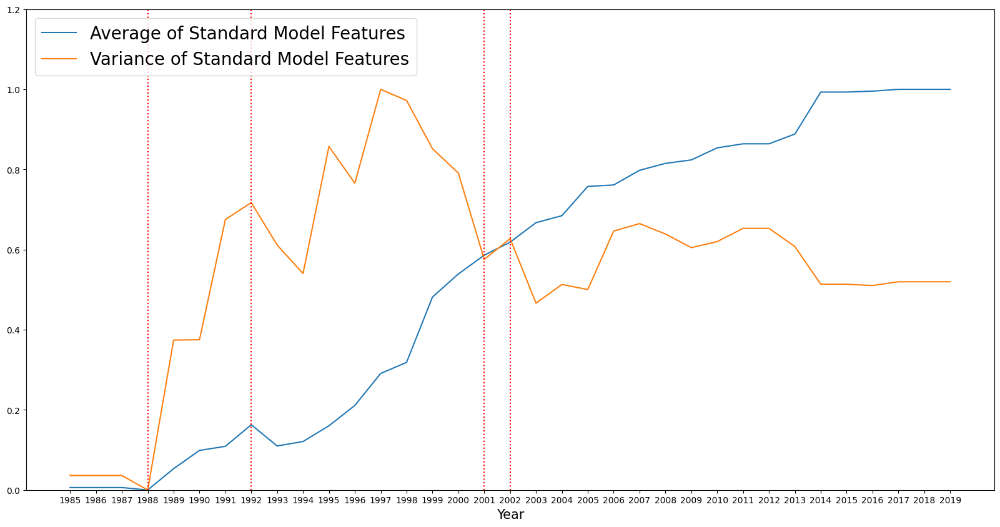

In [ ]:
year_list=[year for year in range(1985,2020)]
temp_text_value_1_list=[]
temp_text_value_2_list=[]

for year in year_list:
  temp_taxa=[np.sum(taxon.representative_vector) for taxon in Taxa_list if taxon.year==year]
  temp_text_value_1_list.append(np.average(temp_taxa))
  temp_text_value_2_list.append(np.var(temp_taxa))
  #temp_text_value_list.append(temp_text_value/37)

fig=plt.figure(figsize=(20,10))

plt.plot(year_list, minmax_scale(temp_text_value_1_list, axis=0, copy=True),label="Average of Standard Model Features")
plt.plot(year_list, minmax_scale(temp_text_value_2_list, axis=0, copy=True),label="Variance of Standard Model Features")

plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("")
plt.ylim([0,1.2])

plt.axvline(x=1988,color='red',linestyle="dotted")
plt.axvline(x=1992,color='red',linestyle="dotted")
plt.axvline(x=2001,color='red',linestyle="dotted")
plt.axvline(x=2002,color='red',linestyle="dotted")

plt.legend(loc='upper left',fontsize=20)
plt.savefig(output_directory+"/Description of Standard Model Features.jpg",dpi=300,transparent=True,bbox_inches="tight")

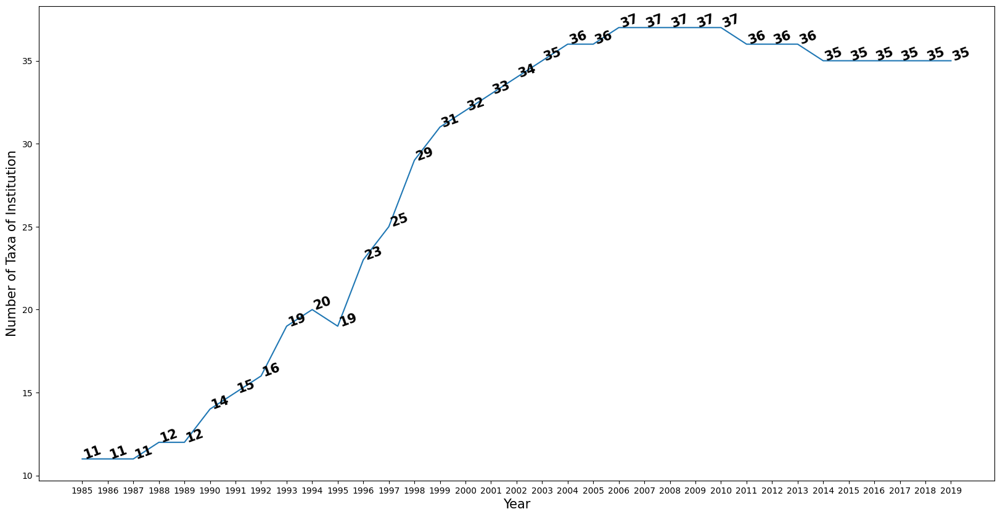

In [ ]:
year_list=[year for year in range(1985,2020)]
temp_y_list=[]

for year in year_list:
  temp_y_list.append(len([taxon for taxon in Taxa_list if taxon.year==year]))

fig=plt.figure(figsize=(20,10))

plt.plot(year_list, temp_y_list)

plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("Number of Taxa of Institution",fontsize=15)

for i in range(len(temp_y_list)):
  plt.text(year_list[i],temp_y_list[i],str(temp_y_list[i]),fontsize=15,fontweight='bold',rotation=20)

#plt.ylim([0,1])
#plt.legend(loc='upper left',fontsize=20)
plt.savefig(output_directory+"/Number of Taxa of Institution.jpg",dpi=300,transparent=True,bbox_inches="tight")

# Tree without Weight

In [ ]:
# Matching Evolutionary Relationship
for taxon in tqdm(Taxa_list):
  taxon.ancestor=Ancestor_Descendant_Single_adjacent_year(taxon,Taxa_list)

for ancestor in Taxa_list:
  temp_list=[]
  for descendant in Taxa_list:
    if descendant.ancestor==ancestor:
      temp_list.append(descendant)
  ancestor.descendants=temp_list

  0%|          | 0/977 [00:00<?, ?it/s]

In [ ]:
Root=TAXON(-1,"root",1984)
Root.representative="root"
t_root = TreeNode(Root)

Node_list=[]
for taxon in Taxa_list:
  Node_list.append(TreeNode(taxon))

temp_list=[]
for Node in Node_list:
  if Node.taxon.year==1985:
    temp_list.append(Node)

t_root.child=temp_list
Node_list.insert(0,t_root)

for Node in tqdm(Node_list):
  if Node.taxon.year>=1985:
    Node.child=[]
    for descendant in Node.taxon.descendants:
      for Node_j in Node_list:
        if descendant.name==Node_j.taxon.name:
          Node.child.append(Node_j)

myTree = Tree(t_root)
myTree.DFT_preorder()

for node in Node_list:
  myTree.pos[node]=(myTree.pos[node][0],myTree.pos[node][1]-myTree.pos[node][0]*10)

  0%|          | 0/978 [00:00<?, ?it/s]

 root
-- ['CHL']
---- ['CHL']
------ ['CHL']
-------- ['CHL']
---------- ['CHL']
------------ ['CHL']
-------------- ['CHL']
---------------- ['CHL']
------------------ ['CHL']
-------------------- ['CHL']
---------------------- ['CHL']
------------------------ ['CHL']
-------------------------- ['CHL']
---------------------------- ['CHL']
------------------------------ ['CHL']
-------------------------------- ['CHL']
---------------------------------- ['CHL']
------------------------------------ ['CHL']
-------------------------------------- ['CHL']
---------------------------------------- ['CHL']
------------------------------------------ ['DEU']
-------------------------------------------- ['DEU']
---------------------------------------------- ['DEU']
------------------------------------------------ ['DEU']
-------------------------------------------------- ['DEU']
---------------------------------------------------- ['DEU']
------------------------------------------ ['CHL']
-------

In [ ]:
G=nx.DiGraph()
temp_threshold=0
for node in Node_list:
  G.add_node(node.taxon.name)
  for temp_child in node.child:
    G.add_node(temp_child.taxon.name)
    G.add_edge(node.taxon.name,temp_child.taxon.name)

In [ ]:
nation_list=[]
for taxon in Taxa_list:
  nation_list+=[re.sub("[^a-zA-Z]","",x.strip()) for x in taxon.representative[1:-1].split(",")]

nation_list=list(set(nation_list))

# Tree with Entropy weight

In [ ]:
gene_dictionary_df=pd.read_csv(input_directory+"/gene_dictionary_df.csv")
gene_dictionary_df.head()

,index,gene
0,0,송발_회계분리
1,1,송발_법인분리
2,2,송발_ISO분리
3,3,송발_소유분리
4,4,배발_회계분리


In [ ]:
gene_dictionary_df["domain"]=[x.split("_")[0] for x in list(gene_dictionary_df["gene"])]

In [ ]:
year_list=[x for x in range(1985,2020)]

In [ ]:
entropy_dict={}

for year in year_list[0:-1]:
  entropy_list=[]
  domain_list=list(set(gene_dictionary_df["domain"]))
  for temp_domain in domain_list:
    temp_gene_dictionary_df=gene_dictionary_df[gene_dictionary_df["domain"]==temp_domain]
    temp_gene_dictionary_df.reset_index(inplace=True,drop=True)
    temp_gene_dictionary_df.head()

    temp_numpy=np.zeros((len(Taxa_list),len(temp_gene_dictionary_df)))
    temp_index_list=list(temp_gene_dictionary_df["index"])

    temp_list=[]
    for taxon in Taxa_list:
      if (taxon.year==year) or (taxon.year==year+1):
        temp_list.append(np.sum(taxon.representative_vector[temp_index_list]))
    #print(temp_list)

    temp_dict=dict(Counter(temp_list))

    for temp_key in list(temp_dict.keys()):
      temp_dict[temp_key]=temp_dict[temp_key]/len(temp_list)

    #print(temp_dict)
    temp_x_list=[x for x in list(temp_dict.keys())]
    temp_y_list=[x for x in list(temp_dict.values())]

    if len(temp_x_list)>=2:
      k=1/(np.log(len(temp_x_list)))
      temp_entropy=-k*sum([temp_y_list[i]*np.log(temp_y_list[i]) for i in range(len(temp_y_list)) if temp_y_list[i]!=0])
      entropy_list.append(temp_entropy)
    else:
      entropy_list.append(0)
  entropy_dict[year]=entropy_list

In [ ]:
weight_dict={}
for year in year_list[:-1]:
  weight_dict[year]=[(1-e)/sum([1-e for e in entropy_dict[year]]) for e in entropy_dict[year]]

In [ ]:
for key in list(weight_dict.keys()):
  weight_dict[key]=dict(zip(domain_list,weight_dict[key]))

In [ ]:
domain_kor_list=[
    '송발',
    '배발',
    '송판',
    '발판',
    '발전 민간참여',
    '송전 민간참여',
    '배전 민간참여',
    '판매 민간참여',
    '도매시장',
    '발전개방',
    '송전개방',
    '지역별 배전',
    '판매개방'
]

domain_eng_list=[
    'Generation – Transmission Unbundling',
    'Generation – Distribution Unbundling',
    'Transmission - Supply Unbundling',
    'Generation - Supply Unbundling',
    'Private Sector Participation in Generation',
    'Private Sector Participation in Transmission',
    'Private Sector Participation in Distribution',
    'Private Sector Participation in Supply',
    'Wholesale market',
    'Open Access in Generation',
    'Open Access in Transmission',
    'Open Access in Distribution',
    'Open Access in Supply'
]

In [ ]:
domain_name_dict=dict(zip(domain_kor_list,domain_eng_list))

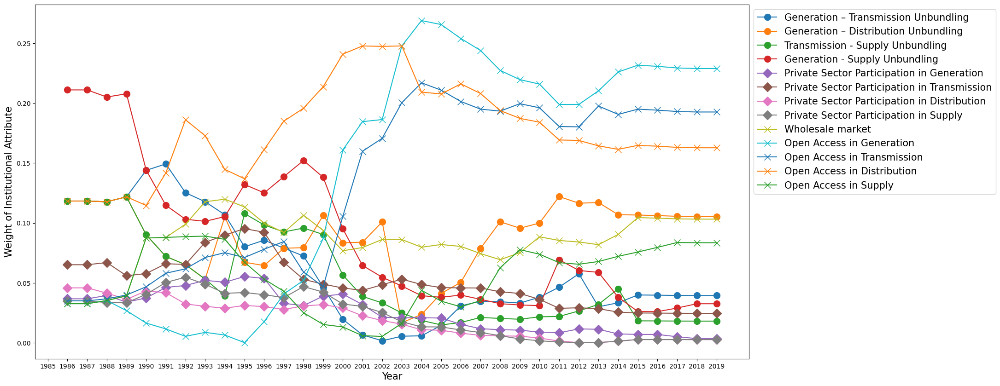

In [ ]:
fig=plt.figure(figsize=(20,10))

for domain in domain_name_dict.keys():
  temp_y_list=[]
  for year in year_list[:-1]:
    temp_y_list.append(weight_dict[year][domain])

  if domain in ['송발','배발','송판','발판']:
    marker='o'
  if domain in ['발전 민간참여','송전 민간참여','배전 민간참여','판매 민간참여']:
    marker='D'
  if domain in ['도매시장','발전개방','송전개방','지역별 배전','판매개방']:
    marker='x'
  plt.plot(year_list[1:],temp_y_list,label=domain_name_dict[domain],marker=marker,markersize=10)


plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("Weight of Institutional Attribute",fontsize=15)

plt.legend(bbox_to_anchor=(1,1),fontsize=15)
plt.savefig(output_directory+"/Weight of Institutional Attribute.jpg",dpi=300,transparent=True,bbox_inches="tight")


In [ ]:
for i in font_manager.fontManager.ttflist:
    if "Nanum" in i.name:
        print(i)


FontEntry(fname='c:\\Users\\jdwoo\\miniconda3\\envs\\newenv\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\NanumMyeongjo.ttf', name='NanumMyeongjo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')
FontEntry(fname='C:\\Users\\jdwoo\\AppData\\Local\\Microsoft\\Windows\\Fonts\\NanumMyeongjoBold.otf', name='NanumMyeongjoOTF', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')
FontEntry(fname='C:\\Windows\\Fonts\\NanumGothic.ttf', name='NanumGothic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')
FontEntry(fname='C:\\Users\\jdwoo\\AppData\\Local\\Microsoft\\Windows\\Fonts\\NanumMyeongjoExtraBold.otf', name='NanumMyeongjoOTF', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')
FontEntry(fname='C:\\Users\\jdwoo\\AppData\\Local\\Microsoft\\Windows\\Fonts\\NanumMyeongjo.otf', name='NanumMyeongjoOTF', style='normal', variant='normal', weight=400, stretch='normal'

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\3787782341.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(temp_x_list,rotation=90)
C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\3787782341.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(temp_x_list,rotation=90)
C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\3787782341.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(temp_x_list,rotation=90)
C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\3787782341.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(temp_x_list,rotation=90)
C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\3787782341.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(temp_x_list,rotation=90)
C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\37877

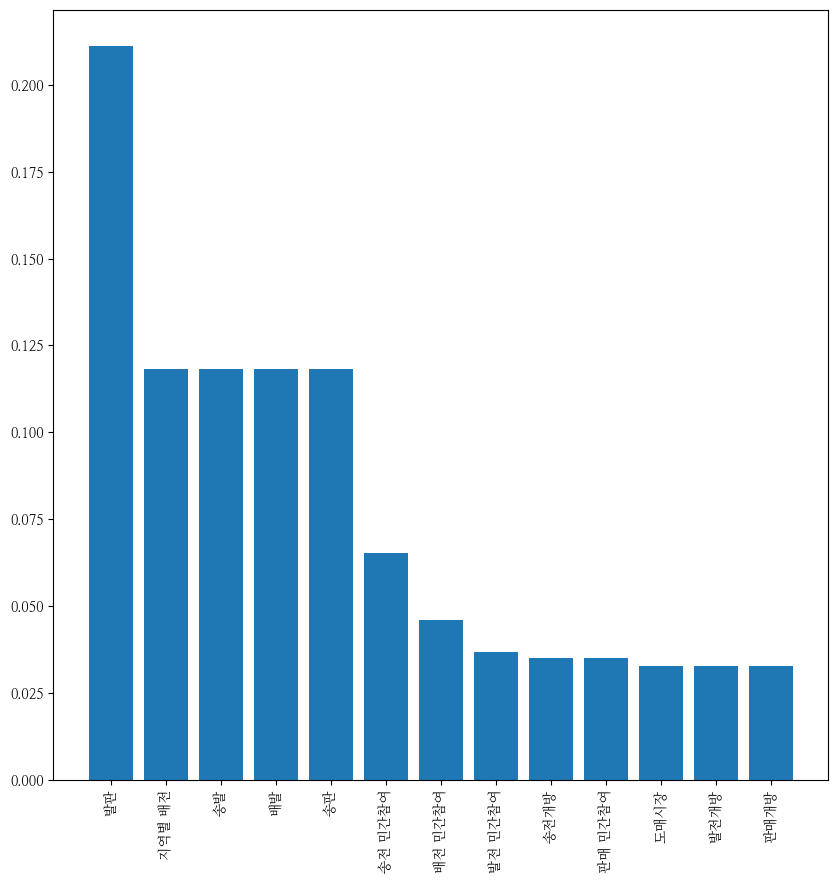

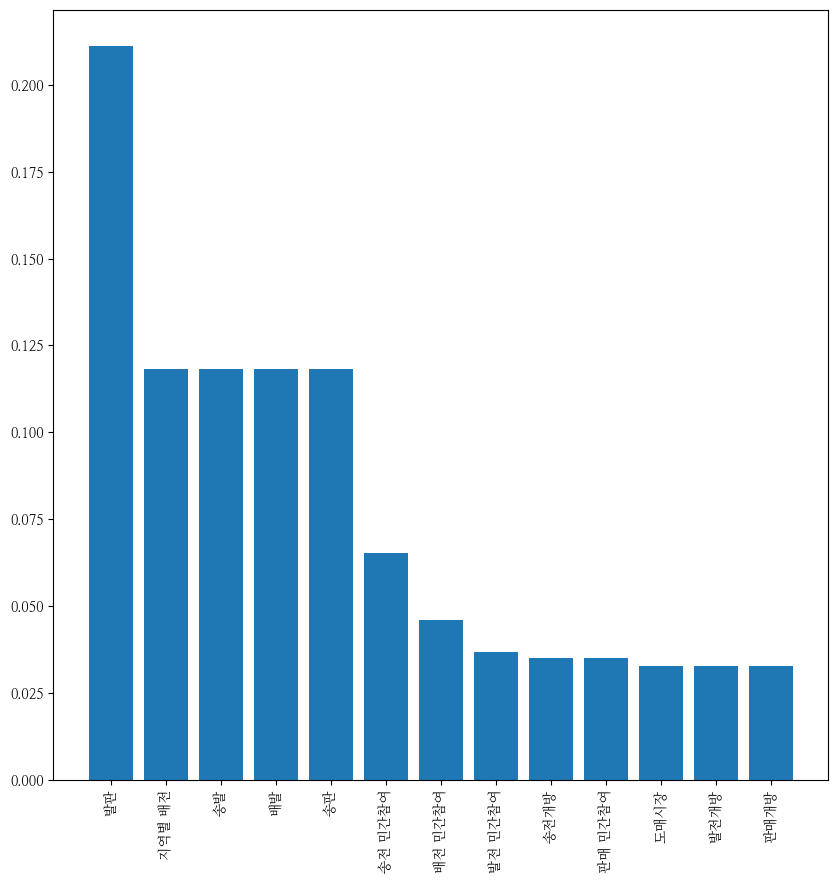

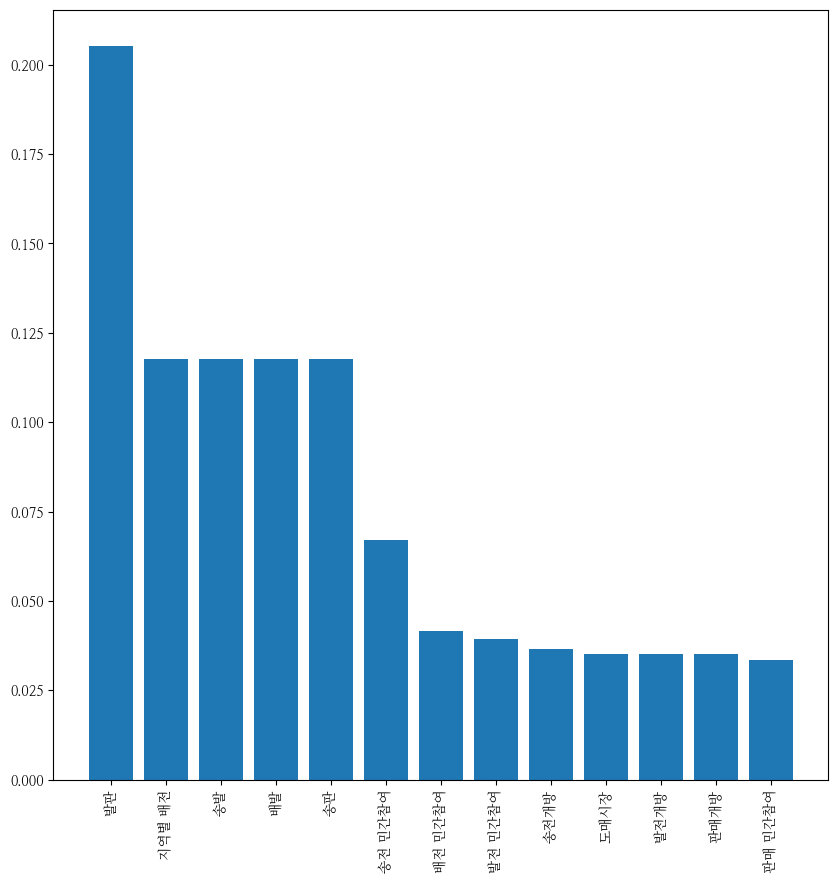

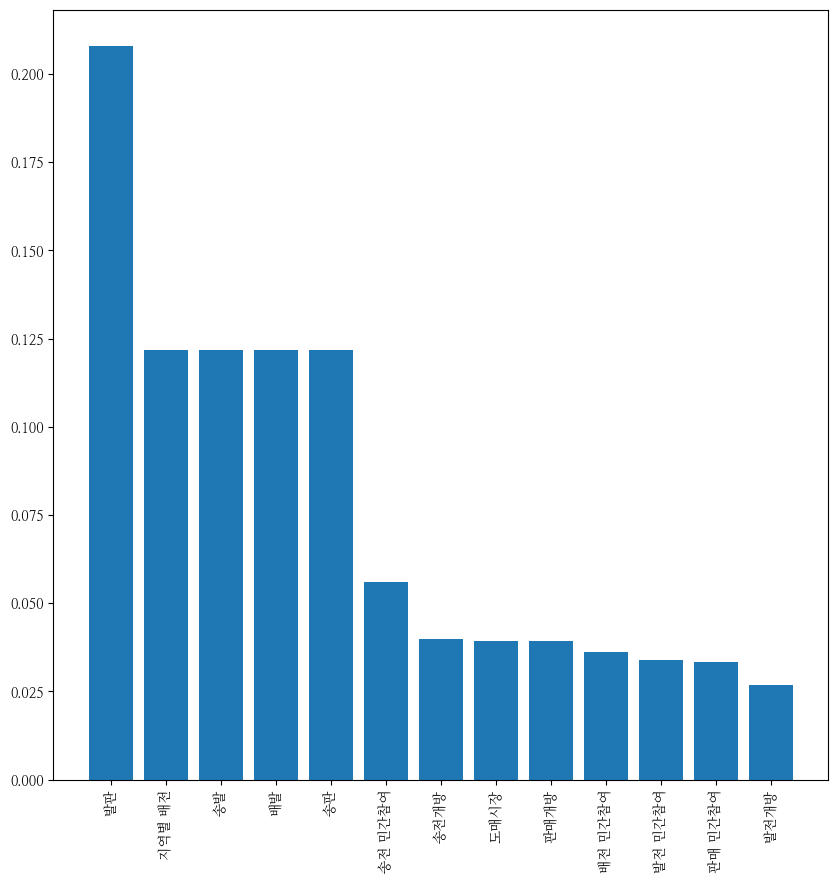

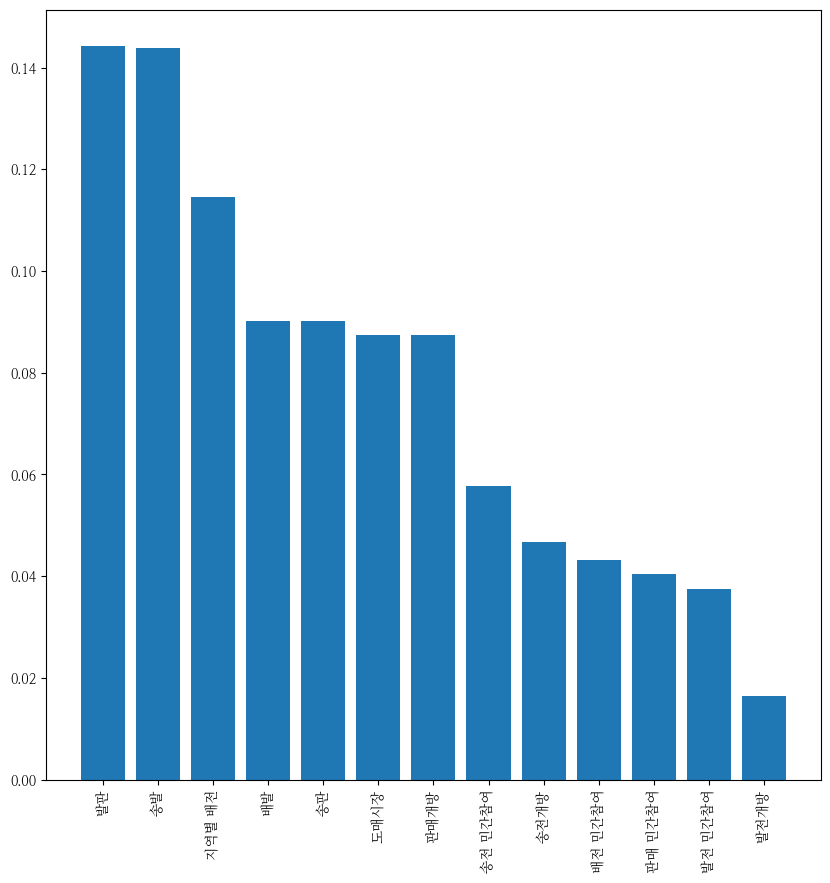

...

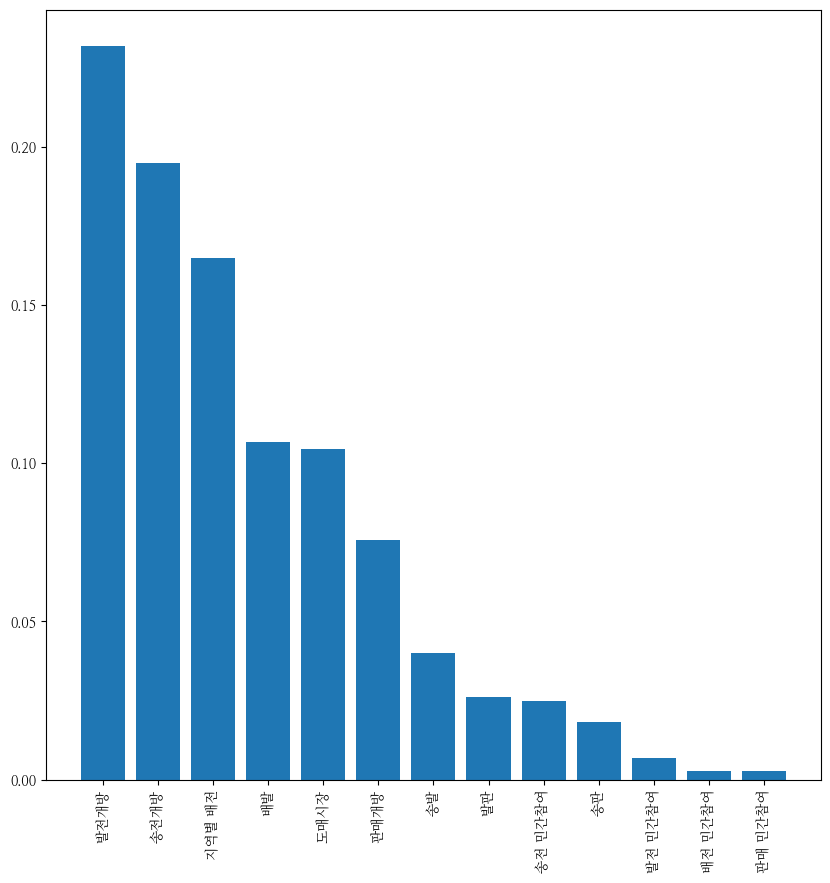

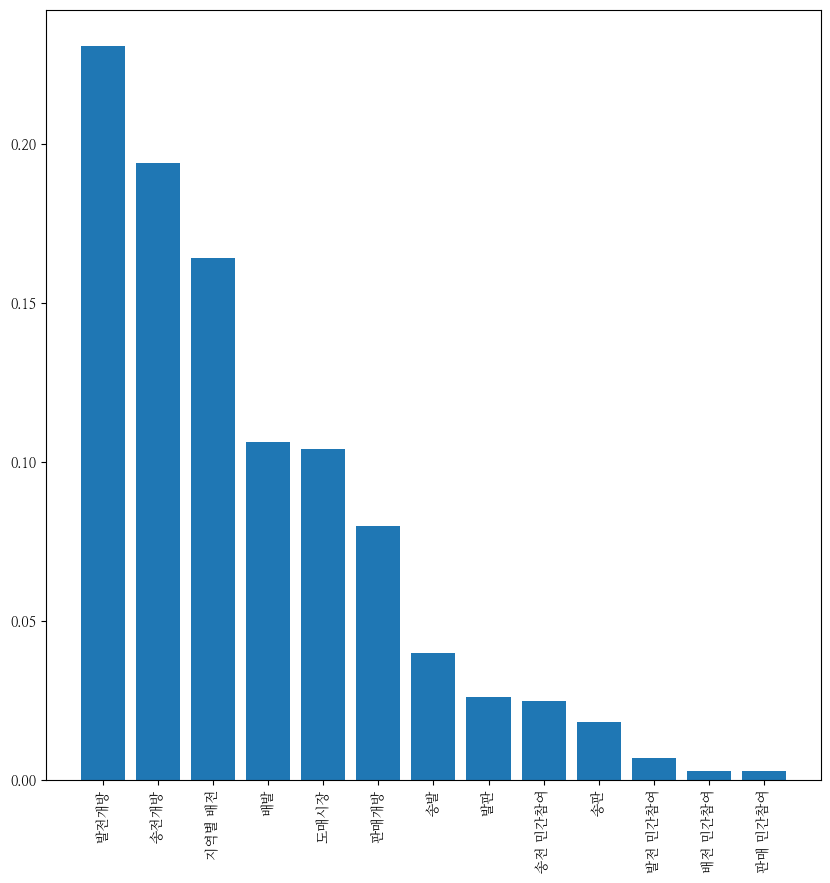

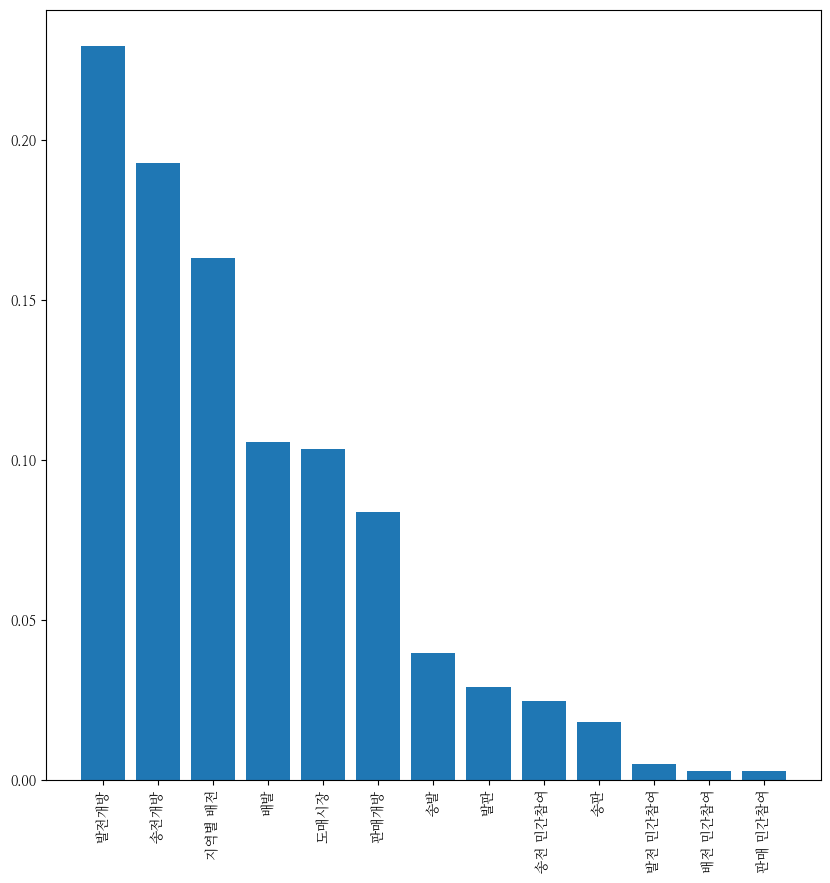

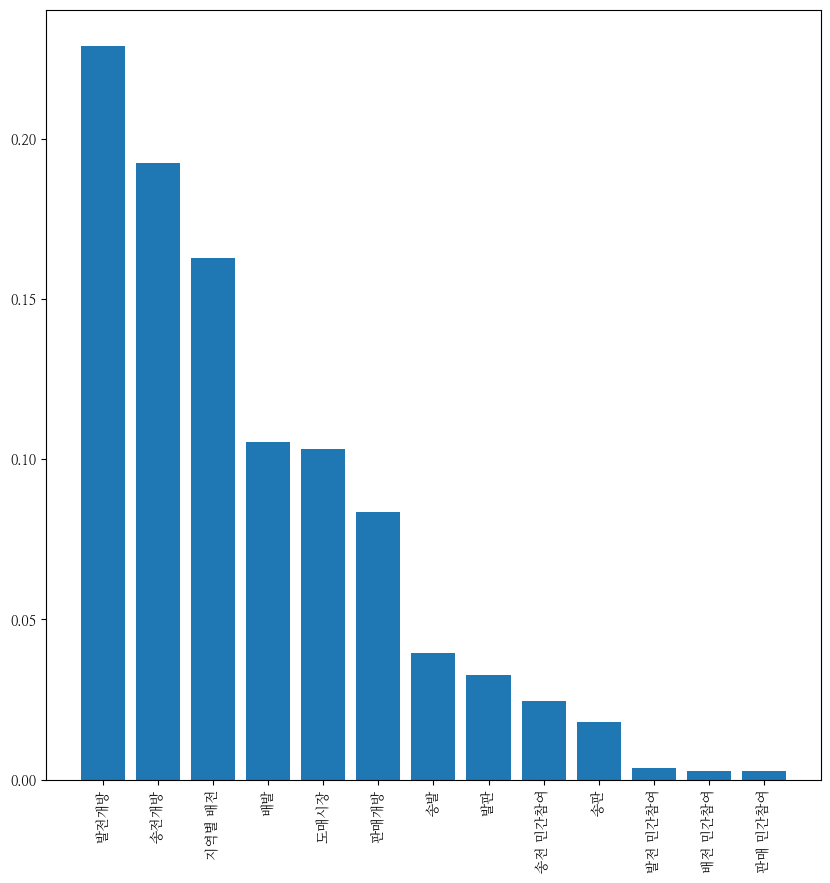

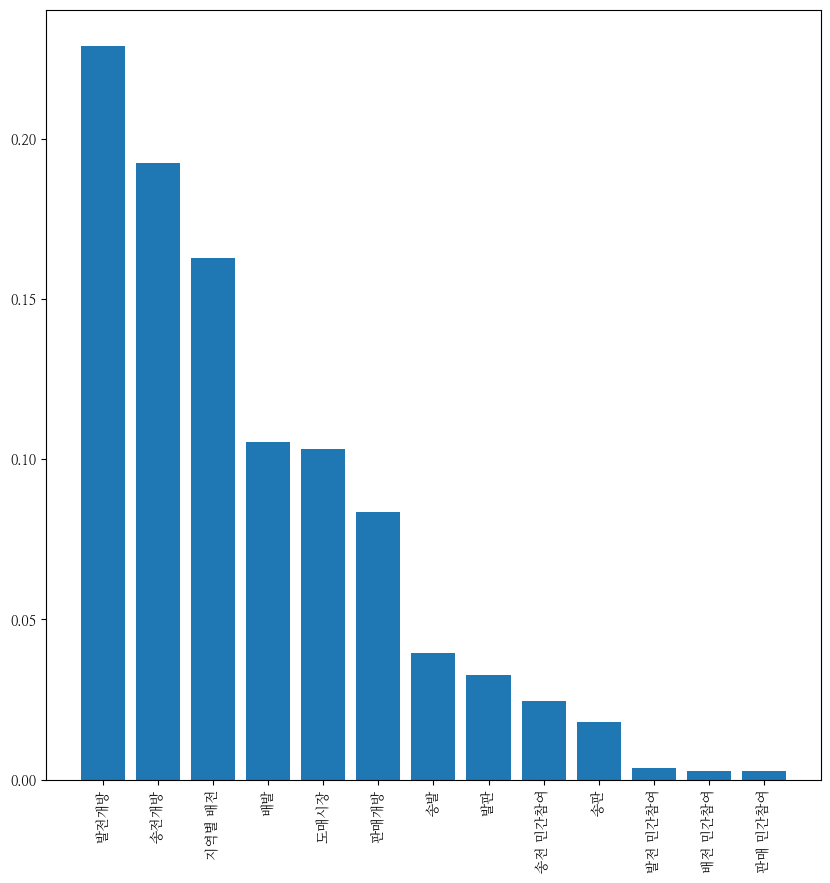

In [ ]:
mpl.rcParams['font.family']='NanumMyeongjo'
for year in year_list[0:-1]:
  fig=plt.figure(figsize=(10,10))
  ax=plt.subplot(111)
  temp_s=sorted(weight_dict[year].items(),key=lambda item:item[1],reverse=True)
  temp_x_list=[x[0] for x in temp_s]
  temp_y_list=[x[1] for x in temp_s]

  ax.bar(temp_x_list,temp_y_list)

  ax.set_xticklabels(temp_x_list,rotation=90)

  plt.savefig(output_directory+"/attribute_weight_"+str(year)+"_"+str(year+1)+".jpg",dpi=200,transparent=True,bbox_inches="tight")

In [ ]:
mpl.rcParams['font.family']='Sans Serif'

In [ ]:
# weighted similarity
def weighted_similarity(vector1,vector2,input_weight_dictionary):
  temp_sim_list=[]
  for domain in domain_list:
    temp_index_list=list(gene_dictionary_df[gene_dictionary_df["domain"]==domain]["index"])
    temp_sim_list.append(jaccard_similarity(vector1[temp_index_list],vector2[temp_index_list]))
  return sum([input_weight_dictionary[domain_list[i]]*temp_sim_list[i] for i in range(len(temp_sim_list))])

In [ ]:
nation_df=pd.read_csv(input_directory+"/Regime.csv")
vectors=np.load(input_directory+"/Regime.npy")
nation_df["genotype"]=list(vectors)

In [ ]:
def weighted_Ancestor_Descendant_Single_adjacent_year(descendant_taxon,taxa_list,input_weight_dictionary):
  if descendant_taxon.year==min([taxon.year for taxon in taxa_list]):
    return None

  else:
    temp_list=[]
    temp_taxa_list=[]
    for taxon in taxa_list:
      if taxon.year==descendant_taxon.year-1:
        temp_list.append(weighted_similarity(taxon.representative_vector,descendant_taxon.representative_vector,input_weight_dictionary))
        temp_taxa_list.append(taxon)
      else:
        temp_list.append(-1)
        temp_taxa_list.append(taxon)
    return temp_taxa_list[temp_list.index(max(temp_list))]

In [ ]:
# Matching Evolutionary Relationship
for taxon in tqdm(Taxa_list):
  if taxon.year>=1986:
    taxon.ancestor=weighted_Ancestor_Descendant_Single_adjacent_year(taxon,Taxa_list,weight_dict[taxon.year-1])
  #else:
  #  taxon.ancestor=weighted_Ancestor_Descendant_Single_adjacent_year(taxon,Taxa_list,weight_dict[taxon.year-1])

for ancestor in Taxa_list:
  temp_list=[]
  for descendant in Taxa_list:
    if descendant.ancestor==ancestor:
      temp_list.append(descendant)
  ancestor.descendants=temp_list

  0%|          | 0/977 [00:00<?, ?it/s]

In [ ]:

for taxon in Taxa_list:
  if taxon.year==2019:
    if taxon.name=="2019_0":
      taxon.representative="taxon 1"
    elif taxon.name=="2019_20":
      taxon.representative="taxon 2"
    elif taxon.name=="2019_8":
      taxon.representative="taxon 3"
    elif taxon.name=="2019_24":
      taxon.representative="taxon 4"
    elif taxon.name=="2019_14":
      taxon.representative="taxon 5"
    elif taxon.name=="2019_7":
      taxon.representative="taxon 6"
    elif taxon.name=="2019_21":
      taxon.representative="taxon 7"
    elif taxon.name=="2019_5":
      taxon.representative="taxon 8"
    elif taxon.name=="2019_17":
      taxon.representative="taxon 9"
    elif taxon.name=="2019_19":
      taxon.representative="taxon 10"
    elif taxon.name=="2019_23":
      taxon.representative="taxon 11"
    elif taxon.name=="2019_32":
      taxon.representative="taxon 12"
    elif taxon.name=="2019_12":
      taxon.representative="taxon 13"
    elif taxon.name=="2019_25":
      taxon.representative="taxon 14"
    elif taxon.name=="2019_33":
      taxon.representative="taxon 15"
    elif taxon.name=="2019_13":
      taxon.representative="taxon 16"
    elif taxon.name=="2019_16":
      taxon.representative="taxon 17"
    elif taxon.name=="2019_2":
      taxon.representative="taxon 18"
    elif taxon.name=="2019_3":
      taxon.representative="taxon 19"
    elif taxon.name=="2019_29":
      taxon.representative="taxon 20"
    elif taxon.name=="2019_4":
      taxon.representative="taxon 21"
    elif taxon.name=="2019_9":
      taxon.representative="taxon 22"
    elif taxon.name=="2019_30":
      taxon.representative="taxon 23"
    elif taxon.name=="2019_31":
      taxon.representative="taxon 24"
    elif taxon.name=="2019_34":
      taxon.representative="taxon 25"
    elif taxon.name=="2019_18":
      taxon.representative="taxon 26"
    elif taxon.name=="2019_6":
      taxon.representative="taxon 27"
    elif taxon.name=="2019_11":
      taxon.representative="taxon 28"
    elif taxon.name=="2019_22":
      taxon.representative="taxon 29"
    elif taxon.name=="2019_28":
      taxon.representative="taxon 30"
    elif taxon.name=="2019_26":
      taxon.representative="taxon 31"
    elif taxon.name=="2019_10":
      taxon.representative="taxon 32"
    elif taxon.name=="2019_27":
      taxon.representative="taxon 33"
    elif taxon.name=="2019_1":
      taxon.representative="taxon 34"
    elif taxon.name=="2019_15":
      taxon.representative="taxon 35"


In [ ]:
Root=TAXON(-1,"root",1984)
Root.representative="root"
t_root = TreeNode(Root)

Node_list=[]
for taxon in Taxa_list:
  Node_list.append(TreeNode(taxon))

temp_list=[]
for Node in Node_list:
  if Node.taxon.year==1985:
    temp_list.append(Node)

t_root.child=temp_list
Node_list.insert(0,t_root)

for Node in tqdm(Node_list):
  if Node.taxon.year>=1985:
    Node.child=[]
    for descendant in Node.taxon.descendants:
      for Node_j in Node_list:
        if descendant.name==Node_j.taxon.name:
          Node.child.append(Node_j)

myTree = Tree(t_root)
myTree.DFT_preorder()

for node in Node_list:
  myTree.pos[node]=(myTree.pos[node][0],myTree.pos[node][1]-myTree.pos[node][0]*10)

  0%|          | 0/978 [00:00<?, ?it/s]

 root
-- ['CHL']
---- ['CHL']
------ ['CHL']
-------- ['CHL']
---------- ['CHL']
------------ ['CHL']
-------------- ['CHL']
---------------- ['CHL']
------------------ ['CHL']
-------------------- ['CHL']
---------------------- ['CHL']
------------------------ ['CHL']
-------------------------- ['CHL']
---------------------------- ['CHL']
------------------------------ ['CHL']
-------------------------------- ['CHL']
---------------------------------- ['CHL']
------------------------------------ ['CHL']
-------------------------------------- ['CHL']
---------------------------------------- ['CHL']
------------------------------------------ ['CHL']
-------------------------------------------- ['CHL']
---------------------------------------------- ['CHL']
------------------------------------ ['DEU']
-------------------------------------- ['DEU']
---------------------------------------- ['DEU']
------------------------------------------ ['DEU']
-------------- ['GBR']
---------------- ['G

In [ ]:
G=nx.DiGraph()
temp_threshold=0
for node in Node_list:
  G.add_node(node.taxon.name)
  for temp_child in node.child:
    G.add_node(temp_child.taxon.name)
    G.add_edge(node.taxon.name,temp_child.taxon.name)

In [ ]:
nation_list=[]
for taxon in Taxa_list:
  nation_list+=[re.sub("[^a-zA-Z]","",x.strip()) for x in taxon.representative[1:-1].split(",")]

nation_list=list(set(nation_list))

In [ ]:
# default // input_layout = dot inverse
# input_layout_dict = {
    #'spring': nx.spring_layout(G),
    #'spectral':nx.spectral_layout(G),
    #'shell':nx.shell_layout(G),
    #'circular':nx.circular_layout(G),
    #'kamada_kawai':nx.kamada_kawai_layout(G),
    #'random':nx.random_layout(G),
    #'neato':graphviz_layout(G, prog="neato",root='root'),
    #"twopi":graphviz_layout(G, prog="twopi",root='root'),
    #"dot":graphviz_layout(G, prog="dot",root='root'),
    #"fdp":graphviz_layout(G, prog="fdp",root='root'),
    #"sfdp":graphviz_layout(G, prog="sfdp",root='root'),
    #"circo":graphviz_layout(G, prog="circo",root='root')}

def phylogenetic_tree_Single(input_G,input_Node_list,input_style,input_lw,input_temp_title,name_mode,input_labels_list):
  pos1=graphviz_layout(input_G, prog="dot",root='root')
  temp_pos=pos1
  pos1={}
  for key in list(temp_pos.keys()):
    pos1[key]=[0,0]
    pos1[key][0]=(temp_pos[key][0])
    pos1[key][1]=(-temp_pos[key][1])
  fig = plt.figure(figsize=(50,50))
  ax=plt.subplot(111)
  nx.draw_networkx_nodes(input_G,pos=pos1,node_color="red",alpha=0.5,node_size=0)
  #nx.draw_networkx_nodes(input_G,pos=pos1,node_color="red",nodelist=["root"],alpha=1)

  # root node의 후손 연결해주기
  """
  for temp_child in input_Node_list[0].child:
    temp_edge=(input_Node_list[0].taxon.name,temp_child.taxon.name)
    ax.annotate("",
              xy=(pos1[temp_child.taxon.name][0],pos1[temp_child.taxon.name][1]),
              xytext=(pos1[input_Node_list[0].taxon.name][0],pos1[input_Node_list[0].taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="red",
                            alpha=jaccard_similarity(text_model.genotype,temp_child.taxon.representative_vector)

                            )

                  )
    ax.annotate("",
              xy=(pos1[temp_child.taxon.name][0],pos1[temp_child.taxon.name][1]),
              xytext=(pos1[input_Node_list[0].taxon.name][0],pos1[input_Node_list[0].taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="blue",
                            alpha=jaccard_similarity(zero_model.genotype,temp_child.taxon.representative_vector)

                            )

                  )


    ax.plot([pos1[input_Node_list[0].taxon.name][0],pos1[temp_child.taxon.name][0]],
                  [pos1[input_Node_list[0].taxon.name][1],pos1[temp_child.taxon.name][1]],
                  color="red")

    nx.draw_networkx_edges(input_G,
                           pos=pos1,
                           alpha=1,
                           edgelist=[temp_edge],
                           width=20,
                           arrows=False,
                           edge_color="red")
    """

  # root node이외의 선조 후손 관계 연결
  for node in input_Node_list:
    if node.taxon.name!="root":
      if node.taxon.descendants:
        for descendant in node.taxon.descendants:
          temp_edge=(node.taxon.name,descendant.name)
          ax.annotate("",
              xy=(pos1[descendant.name][0],pos1[descendant.name][1]),
              xytext=(pos1[node.taxon.name][0],pos1[node.taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="red",
                            alpha=jaccard_similarity(text_model.genotype,descendant.representative_vector)
                            #alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector)

                            #alpha=1
                            #alpha=Gower_similarity(node.taxon.representative_vector,descendant.representative_vector,Cat_list)
                            )
                  )
          ax.annotate("",
              xy=(pos1[descendant.name][0],pos1[descendant.name][1]),
              xytext=(pos1[node.taxon.name][0],pos1[node.taxon.name][1]),
              arrowprops=dict(
                            arrowstyle="-",
                            lw=input_lw,
                            connectionstyle=input_style,
                            #arrowstyle="wedge",
                            color="blue",
                            alpha=jaccard_similarity(zero_model.genotype,descendant.representative_vector)
                            #alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector)

                            #alpha=1
                            #alpha=Gower_similarity(node.taxon.representative_vector,descendant.representative_vector,Cat_list)
                            )
                  )

          """
          nx.draw_networkx_edges(input_G,
                             pos=pos1,
                             #alpha=cosine_similarity(node.taxon.representative_vector,descendant.representative_vector),
                             alpha=jaccard_similarity(node.taxon.representative_vector,descendant.representative_vector),
                             edgelist=[temp_edge],
                             width=20,
                             arrows=False,
                             connectionstyle="arc3,rad=1",
                             #arrowstyle="wedge",
                             edge_color="red",
                             node_size=0)
          """


  # year axis
  root_year=int(Node_list[0].taxon.year)
  final_year=int(Node_list[-1].taxon.year)

  year_list=[year for year in range(root_year,final_year+1)]
  temp_y_min=min([pos1[key][1] for key in list(pos1.keys())])
  temp_y_max=max([pos1[key][1] for key in list(pos1.keys())])
  temp_y_list=sorted(list(set([pos1[key][1] for key in list(pos1.keys())])))

  temp_x_min=min([pos1[key][0] for key in list(pos1.keys())])
  temp_x_max=max([pos1[key][0] for key in list(pos1.keys())])
  temp_x_list=sorted(list(set([pos1[key][0] for key in list(pos1.keys())])))


  ax.vlines(temp_x_max*1.1,temp_y_min,temp_y_max)
  for i in range(len(year_list[1:])):
    ax.text(
        temp_x_max*1.1,
        temp_y_list[i+1],
        #temp_y_min+(i+1)*((temp_y_max-temp_y_min)/len(year_list)),
        year_list[i+1],
        fontsize=40
    )

  ax.spines["top"].set_visible(False)
  ax.spines["left"].set_visible(False)
  ax.spines["right"].set_visible(False)
  ax.spines["bottom"].set_visible(False)

  #plt.grid(True, axis='y', color='gray', alpha=0.5, linestyle='--')


  # color bar


  # labeling
  if name_mode:
    for node in input_Node_list:
      if node.taxon.name!="root":
        ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.name,rotation=30,fontsize=40)

    plt.tight_layout()
    plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_200_wo_label.jpg",dpi=200,transparent=True,bbox_inches="tight")
    plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_300_wo_label.jpg",dpi=300,transparent=True,bbox_inches="tight")

  else:
    # labeling
    for node in input_Node_list:
      if node.taxon.name!="root":

        # input_labels_list
        if node.taxon.name in input_labels_list:
          if node.taxon.year!=2019:
            #ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.representative,rotation=30,fontsize=20)
            ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],"O",rotation=30,fontsize=40)


          # end node
          if node.taxon.year==2019:
            #ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1]+1,re.sub("[^a-zA-Z, ]","",node.taxon.representative),rotation=30,fontsize=40)
            ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1]+5,node.taxon.representative,rotation=90,fontsize=40)


        # leaf node
        #if not node.taxon.descendants:
        #  ax.text(pos1[node.taxon.name][0],pos1[node.taxon.name][1],node.taxon.representative,rotation=30,fontsize=20)

    #pos1["root"][1]=pos1["root"][1]-50

    #nx.draw_networkx_labels(G,pos=pos1,labels={"root":"Root"},font_size=40,font_weight="bold")


  plt.tight_layout()
  plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_200_w_label.jpg",dpi=200,transparent=True,bbox_inches="tight")
  plt.savefig(output_directory+"/"+input_temp_title+"_Phylogenetic Tree dot inverse_300_w_label.jpg",dpi=300,transparent=True,bbox_inches="tight")

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\4245697584.py:17: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos1=graphviz_layout(input_G, prog="dot",root='root')


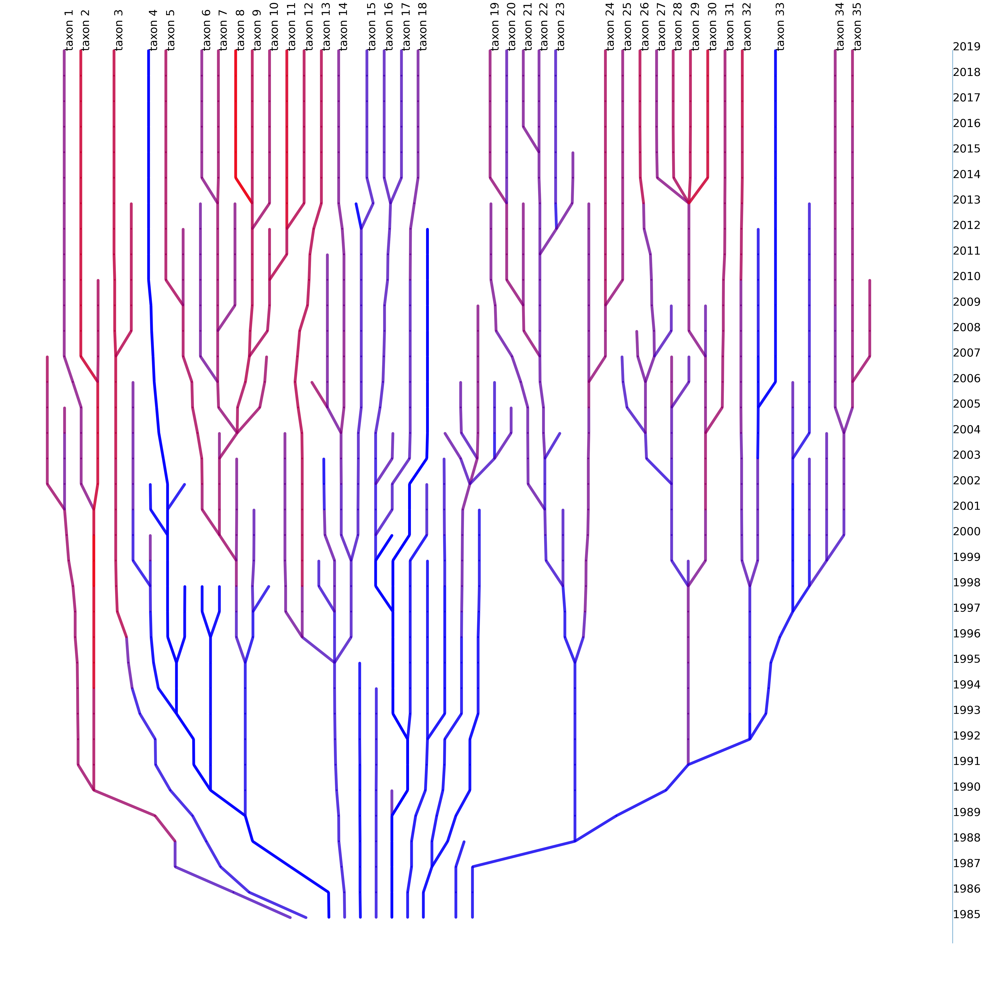

In [ ]:
phylogenetic_tree_Single(G,Node_list,"arc3",10,"Regime_weight",False,[taxon.name for taxon in Taxa_list if taxon.year==2019])

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\2909251176.py:268: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos1=graphviz_layout(input_G, prog="dot",root='root')


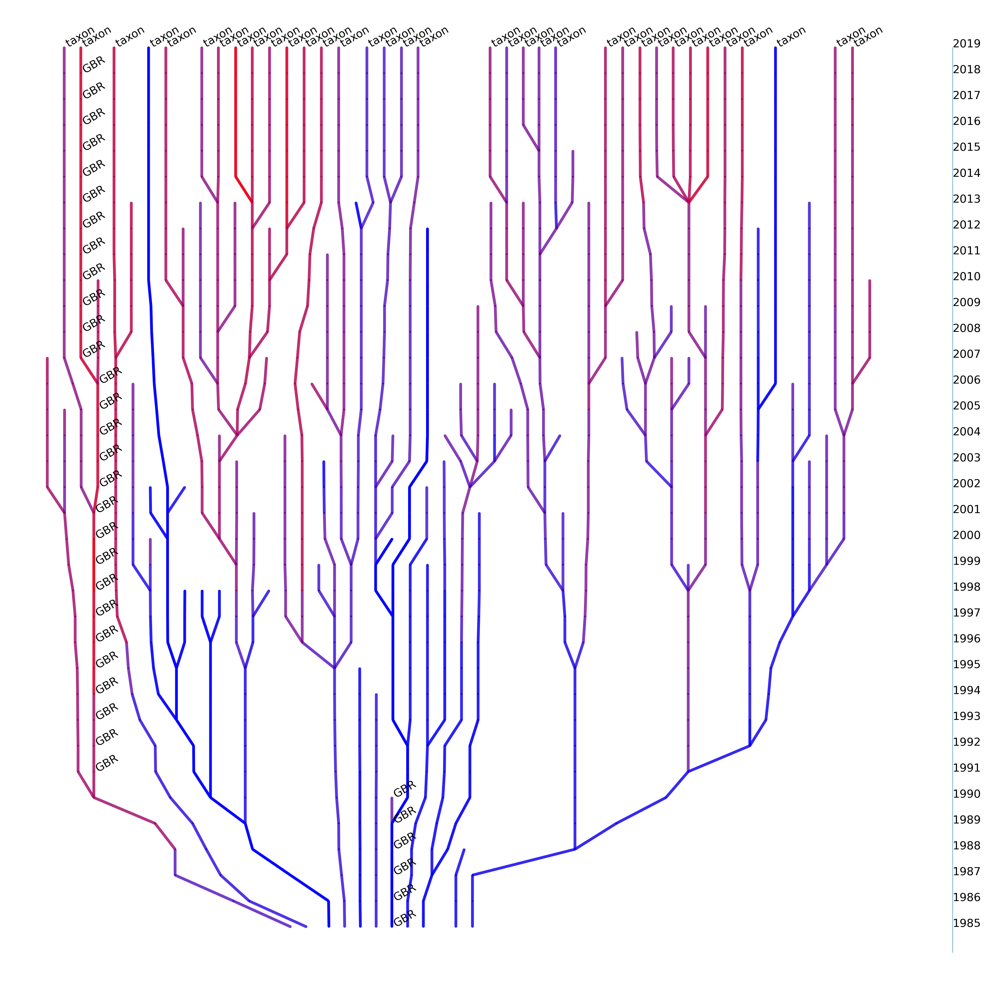

In [ ]:
nation="GBR"
phylogenetic_tree_Single_GBR(G,Node_list,"arc3",10,"rev_Regime_weight_%s"%(nation),False,[taxon.name for taxon in Taxa_list if nation in taxon.products])

# Inertia and Ecological Pressure

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [ ]:
year_list=[x for x in range(1985,2020)]

In [ ]:
# input taxon
def IIN_Regime(input_taxon):
  temp_taxon=input_taxon
  temp_list=[]
  while temp_taxon.ancestor:
    temp_weight_dict=weight_dict[temp_taxon.year-1]
    temp_list.append(weighted_similarity(temp_taxon.ancestor.representative_vector,temp_taxon.representative_vector,temp_weight_dict))
    temp_taxon=temp_taxon.ancestor

  return np.average(temp_list)

In [ ]:
def Pressure(input_taxon):
  temp_year=input_taxon.year
  temp_weight_dict=weight_dict[temp_year-1]

  temp_taxa=[taxon for taxon in Taxa_list if (taxon.year==temp_year) if taxon!=input_taxon]
  temp_value=[]
  for taxon in temp_taxa:
    temp_value.append(weighted_similarity(taxon.ancestor.representative_vector,taxon.representative_vector,temp_weight_dict))

  return 1-sum(temp_value)/len(temp_value)

In [ ]:
temp_Pressure_list=[]
for year in tqdm(year_list[1:]):
  temp_temp_Pressure_list=[]
  for taxon in Taxa_list:
    if taxon.year==year:
      temp_temp_Pressure_list.append(Pressure(taxon))
  temp_Pressure_list.append(np.average(temp_temp_Pressure_list))

  0%|          | 0/34 [00:00<?, ?it/s]

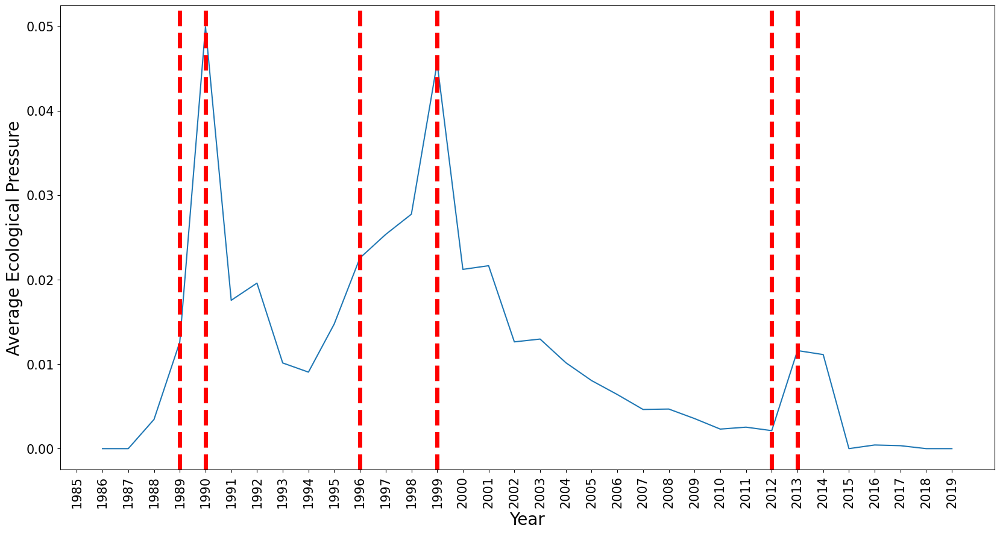

In [ ]:
fig=plt.figure(figsize=(20,10))
ax=plt.subplot(111)

ax.plot(year_list[1:],temp_Pressure_list[:])
ax.set_ylabel("Average Ecological Pressure",fontsize=20)
ax.set_xlabel("Year",fontsize=20)
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=15)

plt.axvline(x=1989,color="red",linestyle="--",linewidth=5)
#plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
plt.axvline(x=1990,color="red",linestyle="--",linewidth=5)
#plt.text(0,2014,"Fukushima")

plt.axvline(x=1996,color="red",linestyle="--",linewidth=5)
#plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
plt.axvline(x=1999,color="red",linestyle="--",linewidth=5)
#plt.text(0,2014,"Fukushima")

plt.axvline(x=2012,color="red",linestyle="--",linewidth=5)
#plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
#plt.text(0,2014,"Fukushima")
plt.xticks(year_list,size=15,rotation=90)

plt.savefig(output_directory+"/pressure.jpg",dpi=1200,transparent=True,bbox_inches="tight")


In [ ]:
terminal_taxon_list=[taxon for taxon in Taxa_list if not taxon.descendants]

phylogeny_list=[]
for terminal_taxon in terminal_taxon_list:
  phylogeny_list+=nx.all_simple_paths(G,"root",terminal_taxon.name)

In [ ]:
for taxon in tqdm(Taxa_list):
  if taxon.year>1985:
    taxon.Inertia=IIN_Regime(taxon)
    taxon.pressure=Pressure(taxon)

  0%|          | 0/977 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

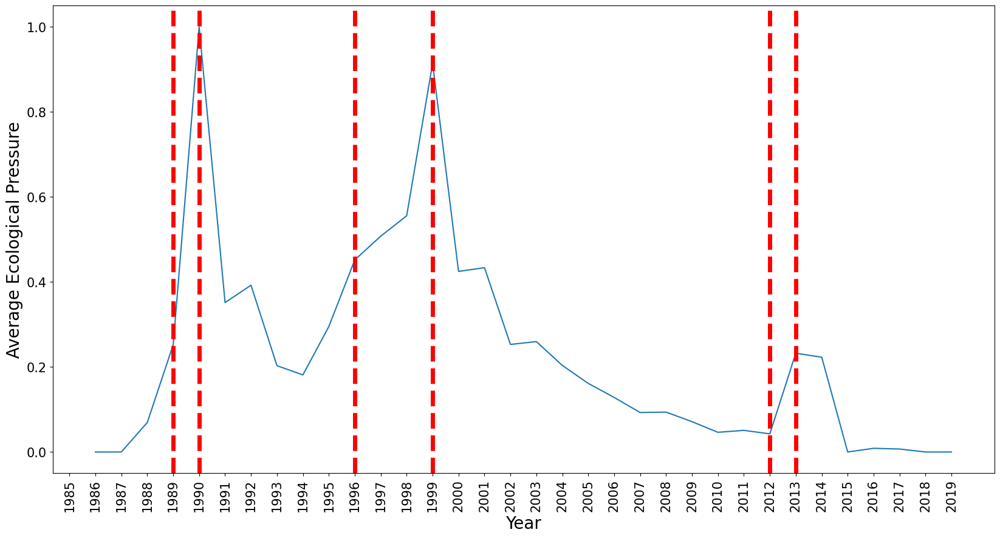

In [ ]:
temp_Pressure_list=[]
for year in tqdm(year_list[1:]):
  temp_temp_Pressure_list=[]
  for taxon in Taxa_list:
    if taxon.year==year:
      temp_temp_Pressure_list.append(taxon.pressure)
  temp_Pressure_list.append(np.average(temp_temp_Pressure_list))

fig=plt.figure(figsize=(20,10))
ax=plt.subplot(111)

ax.plot(year_list[1:],minmax_scale(temp_Pressure_list[:], axis=0, copy=True))
ax.set_ylabel("Average Ecological Pressure",fontsize=20)
ax.set_xlabel("Year",fontsize=20)
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=15)

plt.axvline(x=1989,color="red",linestyle="--",linewidth=5)
#plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
plt.axvline(x=1990,color="red",linestyle="--",linewidth=5)
#plt.text(0,2014,"Fukushima")

plt.axvline(x=1996,color="red",linestyle="--",linewidth=5)
#plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
plt.axvline(x=1999,color="red",linestyle="--",linewidth=5)
#plt.text(0,2014,"Fukushima")

plt.axvline(x=2012,color="red",linestyle="--",linewidth=5)
#plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)
#plt.text(0,2014,"Fukushima")
plt.xticks(year_list,size=15,rotation=90)

plt.savefig(output_directory+"/pressure_2.jpg",dpi=1200,transparent=True,bbox_inches="tight")


  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

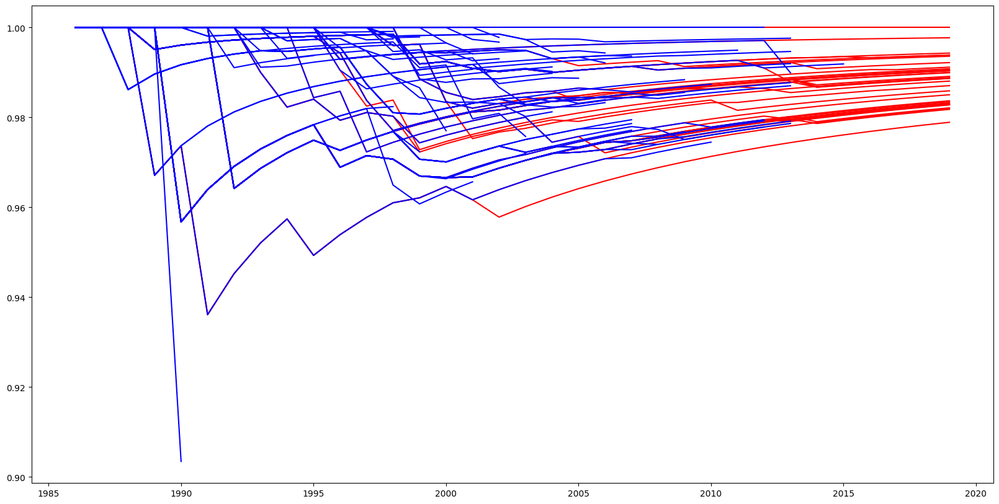

In [ ]:
# survival

temp_phylogeny_list=[]
for phylogeny in tqdm(phylogeny_list):
  temp_taxa=[taxon for taxon in Taxa_list if taxon.name in phylogeny if taxon.year>1985]
  if temp_taxa[-1].year==2019:
    temp_phylogeny_list.append(temp_taxa)

fig=plt.figure(figsize=(20,10))
for temp_phylogeny in tqdm(temp_phylogeny_list):
  temp_country_IIN_list=[taxon.Inertia for taxon in temp_phylogeny]
  temp_country_Pressure_list=[taxon.pressure for taxon in temp_phylogeny]
  #plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_Pressure_list, axis=0, copy=True),color='red')
  plt.plot(year_list[1:len(temp_country_IIN_list)+1],temp_country_IIN_list,color='red')
  #plt.text(year_list[len(temp_country_IIN_list)],temp_country_IIN_list[-1],temp_phylogeny[-1].name)

# extinct
temp_phylogeny_list=[]
for phylogeny in tqdm(phylogeny_list):
  temp_taxa=[taxon for taxon in Taxa_list if taxon.name in phylogeny if taxon.year>1985]
  if temp_taxa[-1].year!=2019:
    temp_phylogeny_list.append(temp_taxa)

for temp_phylogeny in tqdm(temp_phylogeny_list):
  temp_country_IIN_list=[taxon.Inertia for taxon in temp_phylogeny]
  temp_country_Pressure_list=[taxon.pressure for taxon in temp_phylogeny]
  #plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_Pressure_list, axis=0, copy=True),color='red')
  plt.plot(year_list[1:len(temp_country_IIN_list)+1],temp_country_IIN_list,color='blue')
  #plt.text(year_list[len(temp_country_IIN_list)],temp_country_IIN_list[-1],temp_phylogeny[-1].name)


  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

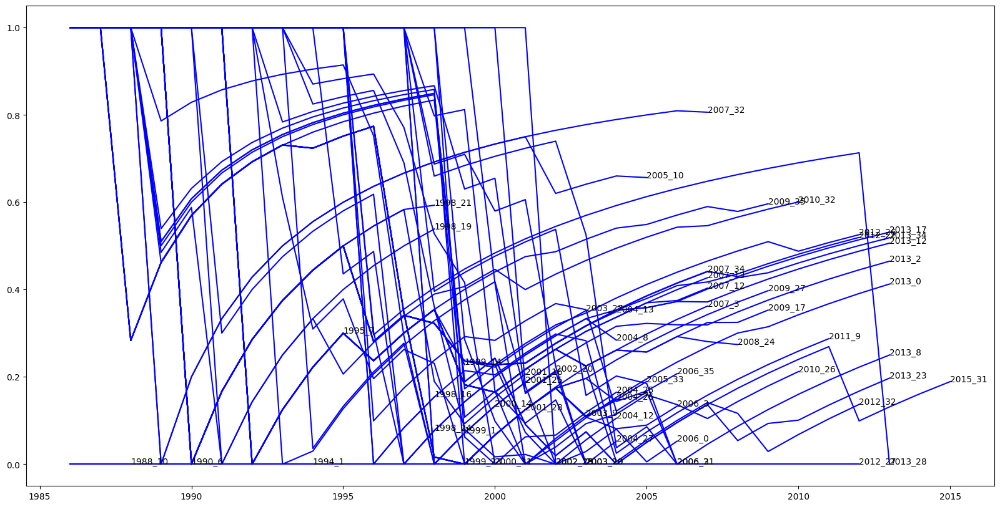

In [ ]:
# extinct

temp_phylogeny_list=[]
for phylogeny in tqdm(phylogeny_list):
  temp_taxa=[taxon for taxon in Taxa_list if taxon.name in phylogeny if taxon.year>1985]
  if temp_taxa[-1].year!=2019:
    temp_phylogeny_list.append(temp_taxa)

fig=plt.figure(figsize=(20,10))
for temp_phylogeny in tqdm(temp_phylogeny_list):
  temp_country_IIN_list=[taxon.Inertia for taxon in temp_phylogeny]
  temp_country_Pressure_list=[taxon.pressure for taxon in temp_phylogeny]
  #plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_Pressure_list, axis=0, copy=True),color='red')
  plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_IIN_list, axis=0, copy=True),color='blue')
  plt.text(year_list[len(temp_country_IIN_list)],minmax_scale(temp_country_IIN_list, axis=0, copy=True)[-1],temp_phylogeny[-1].name)


In [ ]:
color_list=list(mcolors.TABLEAU_COLORS)

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

([<matplotlib.axis.XTick at 0x21a83c69490>,
 [Text(1985, 0, '1985'),
  Text(1986, 0, '1986'),
  Text(1987, 0, '1987'),
  Text(1988, 0, '1988'),
  Text(1989, 0, '1989'),
  Text(1990, 0, '1990'),
  Text(1991, 0, '1991'),
  Text(1992, 0, '1992'),
  Text(1993, 0, '1993'),
  Text(1994, 0, '1994'),
  Text(1995, 0, '1995'),
  Text(1996, 0, '1996'),
  Text(1997, 0, '1997'),
  Text(1998, 0, '1998'),
  Text(1999, 0, '1999'),
  Text(2000, 0, '2000'),
  Text(2001, 0, '2001'),
  Text(2002, 0, '2002'),
  Text(2003, 0, '2003'),
  Text(2004, 0, '2004'),
  Text(2005, 0, '2005'),
  Text(2006, 0, '2006'),
  Text(2007, 0, '2007'),
  Text(2008, 0, '2008'),
  Text(2009, 0, '2009'),
  Text(2010, 0, '2010'),
  Text(2011, 0, '2011'),
  Text(2012, 0, '2012'),
  Text(2013, 0, '2013'),
  Text(2014, 0, '2014'),
  Text(2015, 0, '2015'),
  Text(2016, 0, '2016'),
  Text(2017, 0, '2017'),
  Text(2018, 0, '2018'),
  Text(2019, 0, '2019')])

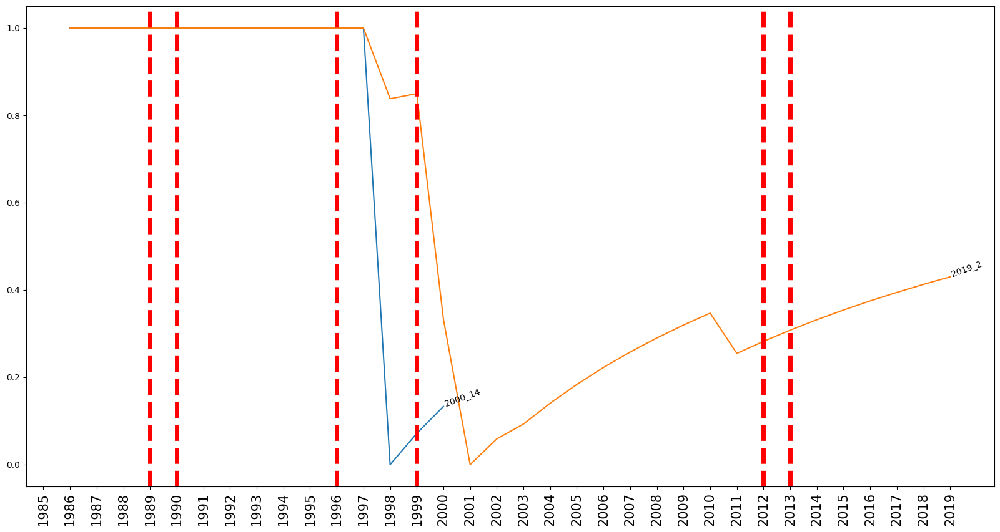

In [ ]:
temp_country_name="KOR"

temp_country_lineage_list=[]
for phylogeny in tqdm(phylogeny_list):
  temp_taxa=[taxon for taxon in Taxa_list if taxon.name in phylogeny if taxon.year>1985]

  if temp_country_name in temp_taxa[-1].products:
    temp_country_lineage_list.append(temp_taxa)

fig=plt.figure(figsize=(20,10))
for temp_country_lineage in tqdm(temp_country_lineage_list):
  temp_country_IIN_list=[IIN_Regime(taxon) for taxon in temp_country_lineage]
  temp_country_Pressure_list=[Pressure(taxon) for taxon in temp_country_lineage]
  #plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_Pressure_list, axis=0, copy=True),color='red')
  plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_IIN_list, axis=0, copy=True),color=color_list[temp_country_lineage_list.index(temp_country_lineage)])
  plt.text(year_list[len(temp_country_IIN_list)],minmax_scale(temp_country_IIN_list, axis=0, copy=True)[-1],temp_country_lineage[-1].name,rotation=20)

plt.axvline(x=1989,color="red",linestyle="--",linewidth=5)
plt.axvline(x=1990,color="red",linestyle="--",linewidth=5)

plt.axvline(x=1996,color="red",linestyle="--",linewidth=5)
plt.axvline(x=1999,color="red",linestyle="--",linewidth=5)

plt.axvline(x=2012,color="red",linestyle="--",linewidth=5)
plt.axvline(x=2013,color="red",linestyle="--",linewidth=5)

plt.xticks(year_list,size=15,rotation=90)

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

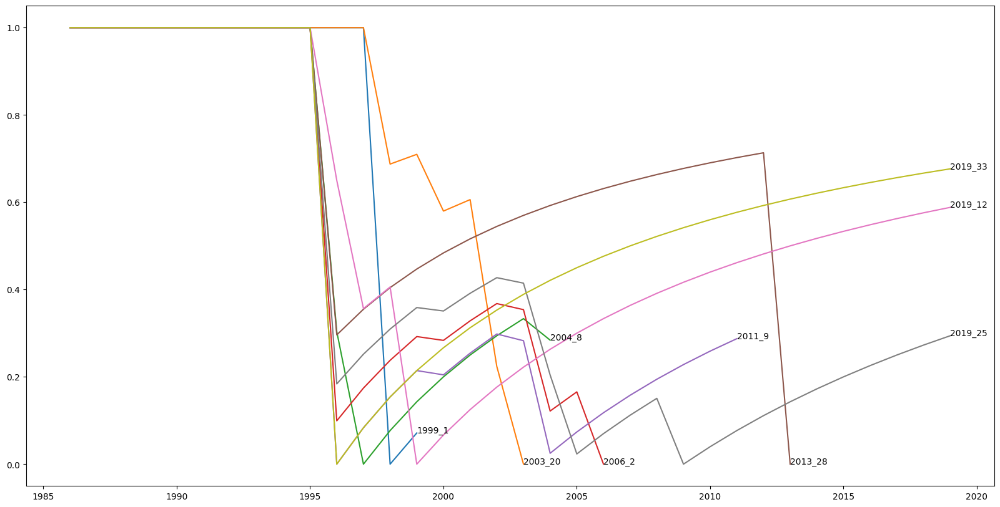

In [ ]:
temp_country_name="USArer"

temp_country_lineage_list=[]
for phylogeny in tqdm(phylogeny_list):
  temp_taxa=[taxon for taxon in Taxa_list if taxon.name in phylogeny if taxon.year>1985]
  for taxon in temp_taxa:
    if temp_country_name in taxon.products:
      temp_country_lineage_list.append(temp_taxa)
      break

fig=plt.figure(figsize=(20,10))
for temp_country_lineage in tqdm(temp_country_lineage_list):
  temp_country_IIN_list=[IIN_Regime(taxon) for taxon in temp_country_lineage]
  temp_country_Pressure_list=[Pressure(taxon) for taxon in temp_country_lineage]
  #plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_Pressure_list, axis=0, copy=True),color='red')
  plt.plot(year_list[1:len(temp_country_IIN_list)+1],minmax_scale(temp_country_IIN_list, axis=0, copy=True),color=color_list[temp_country_lineage_list.index(temp_country_lineage)])
  plt.text(year_list[len(temp_country_IIN_list)],minmax_scale(temp_country_IIN_list, axis=0, copy=True)[-1],temp_country_lineage[-1].name)


In [ ]:
color_list=list(mcolors.TABLEAU_COLORS)

In [ ]:
paths=[]
for taxon in Taxa_list:
  if taxon.year==2019:
    for item in nx.all_simple_paths(G,"root",taxon.name):
      paths.append(item)
len(paths)

35

In [ ]:
paths_taxa=[]
for path in paths:
  temp_list=[]
  for taxon_name in path[1:]:
    for taxon in Taxa_list:
      if taxon.name==taxon_name:
        if taxon.year>=1985:
          temp_list.append(taxon)
  paths_taxa.append(temp_list)

In [ ]:
paths_taxa_dict=dict(zip([x[-1].representative for x in paths_taxa],paths_taxa))

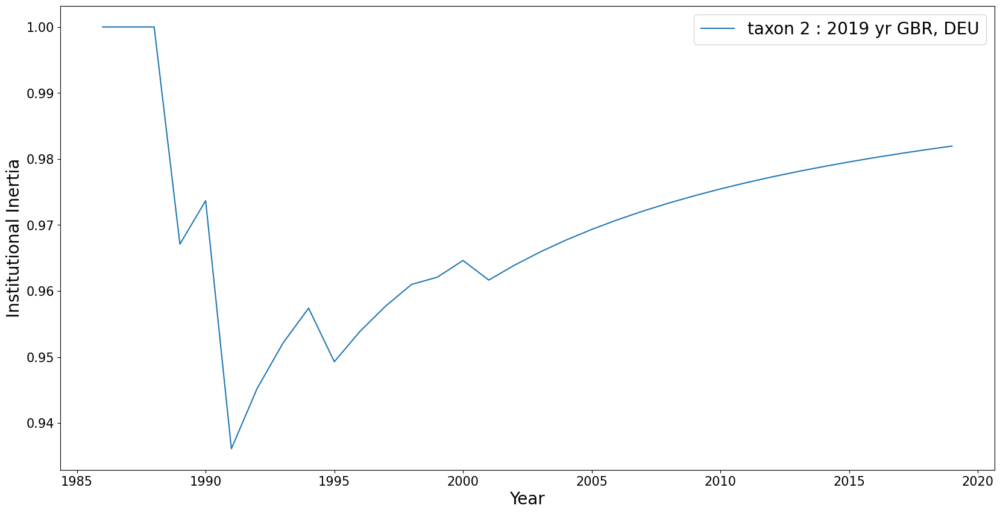

In [ ]:
fig=plt.figure(figsize=(20,10))
#for key in list(paths_taxa_dict.keys()):
temp_x_list=[]
ax=plt.subplot(111)

#if temp_key in ["JPN","KOR","DEU, GBR","FRA"]:
for taxon in paths_taxa_dict["taxon 2"][1:]:
  temp_x_list.append(IIN_Regime(taxon))
ax.plot(year_list[1:],temp_x_list,label="taxon 2 : 2019 yr GBR, DEU")
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=15)
ax.set_ylabel("Institutional Inertia",fontsize=20)
ax.set_xlabel("Year",fontsize=20)

plt.legend(fontsize=20)
plt.savefig(output_directory+"/inertia_a.jpg",dpi=1200,transparent=True,bbox_inches="tight")


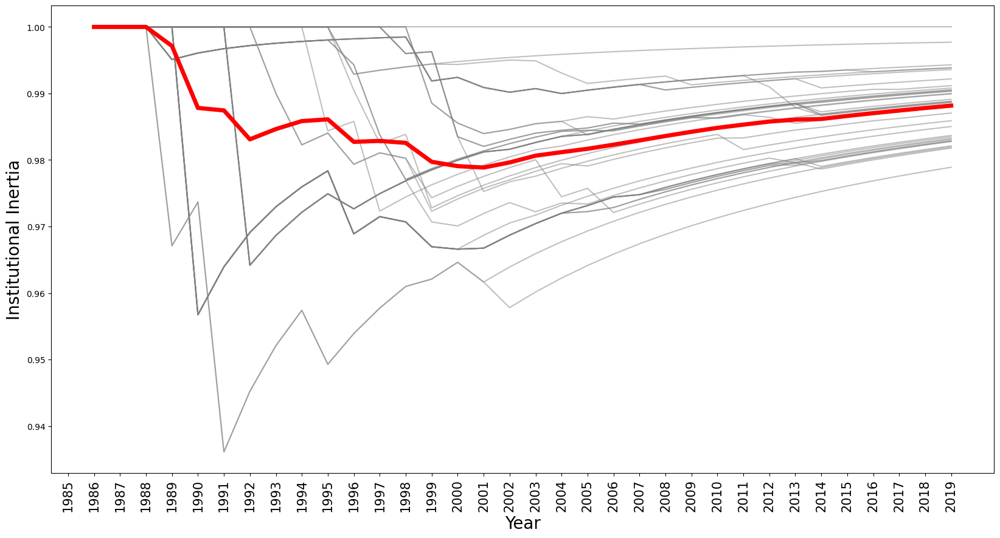

In [ ]:
fig=plt.figure(figsize=(20,10))
#ax=plt.subplot(111)
for key in list(paths_taxa_dict.keys()):
  temp_x_list=[]
  for taxon in paths_taxa_dict[key][1:]:
    temp_x_list.append(taxon.Inertia)
  plt.plot(year_list[1:],temp_x_list,color='grey',alpha=0.5)

temp_average_value_list=[]
for year in year_list[1:]:
  temp_taxa=[]
  for key in list(paths_taxa_dict.keys()):
    for taxon in paths_taxa_dict[key][1:]:
      if taxon.year==year:
        temp_taxa.append(taxon)
  temp_average_value_list.append(np.average([taxon.Inertia for taxon in temp_taxa]))

plt.plot(year_list[1:],temp_average_value_list,color='red',linewidth=5)
#plt.legend()
#ax.tick_params(axis='x', labelsize=15)
#ax.tick_params(axis='y', labelsize=15)
plt.ylabel("Institutional Inertia",fontsize=20)
plt.xlabel("Year",fontsize=20)

plt.xticks(year_list,size=15,rotation=90)
plt.savefig(output_directory+"/221120_inertia_b_300.jpg",dpi=300,transparent=True,bbox_inches="tight")


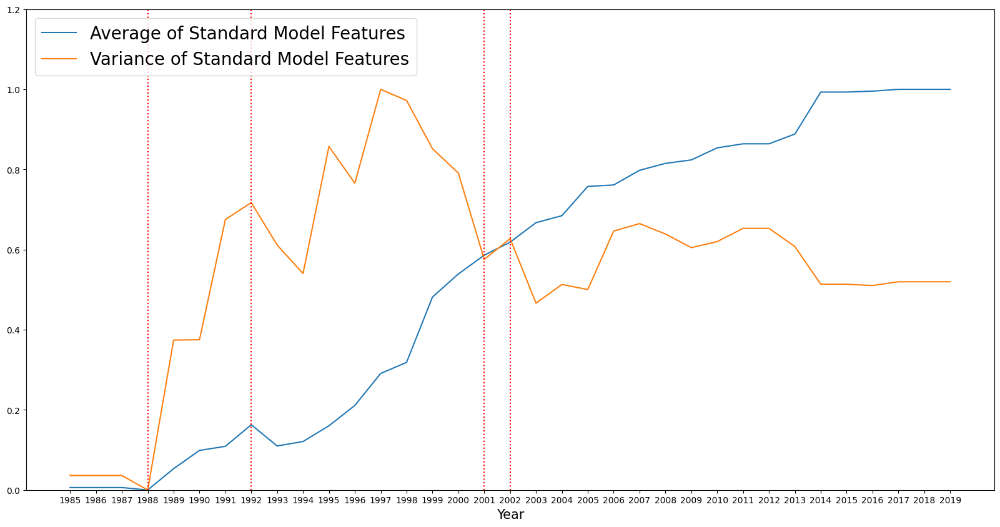

In [ ]:
year_list=[year for year in range(1985,2020)]
temp_text_value_1_list=[]
temp_text_value_2_list=[]

for year in year_list:
  temp_taxa=[np.sum(taxon.representative_vector) for taxon in Taxa_list if taxon.year==year]
  temp_text_value_1_list.append(np.average(temp_taxa))
  temp_text_value_2_list.append(np.var(temp_taxa))
  #temp_text_value_list.append(temp_text_value/37)

fig=plt.figure(figsize=(20,10))

plt.plot(year_list, minmax_scale(temp_text_value_1_list, axis=0, copy=True),label="Average of Standard Model Features")
plt.plot(year_list, minmax_scale(temp_text_value_2_list, axis=0, copy=True),label="Variance of Standard Model Features")

plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("")
plt.ylim([0,1.2])

plt.axvline(x=1988,color='red',linestyle="dotted")
plt.axvline(x=1992,color='red',linestyle="dotted")
plt.axvline(x=2001,color='red',linestyle="dotted")
plt.axvline(x=2002,color='red',linestyle="dotted")

plt.legend(loc='upper left',fontsize=20)
plt.savefig(output_directory+"/Description of Standard Model Features.jpg",dpi=300,transparent=True,bbox_inches="tight")

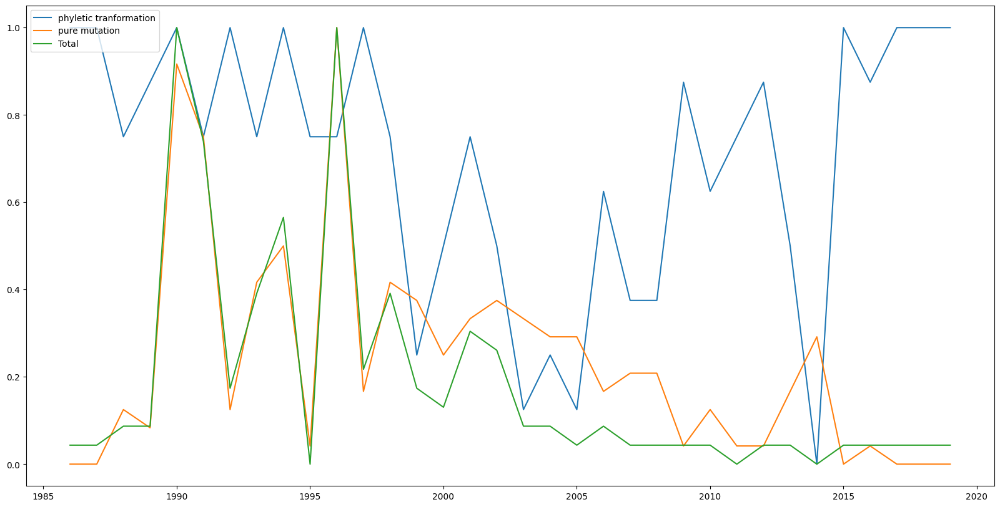

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_pure_mutation+=len(set(taxon.ancestor.products).difference(set(taxon.products)))
    temp_phyletic_transformation+=len(set(taxon.ancestor.products).intersection(set(taxon.products)))
  temp_pure_mutation_list.append(temp_pure_mutation)
  temp_phyletic_transformation_list.append(temp_phyletic_transformation)
  temp_total_list.append(temp_pure_mutation+temp_phyletic_transformation)

fig=plt.figure(figsize=(20,10))
plt.plot(year_list[1:],minmax_scale(temp_phyletic_transformation_list, axis=0, copy=True),label="phyletic tranformation")
plt.plot(year_list[1:],minmax_scale(temp_pure_mutation_list, axis=0, copy=True),label="pure mutation")
plt.plot(year_list[1:],minmax_scale(temp_total_list, axis=0, copy=True),label="Total")

plt.legend(loc='upper left')

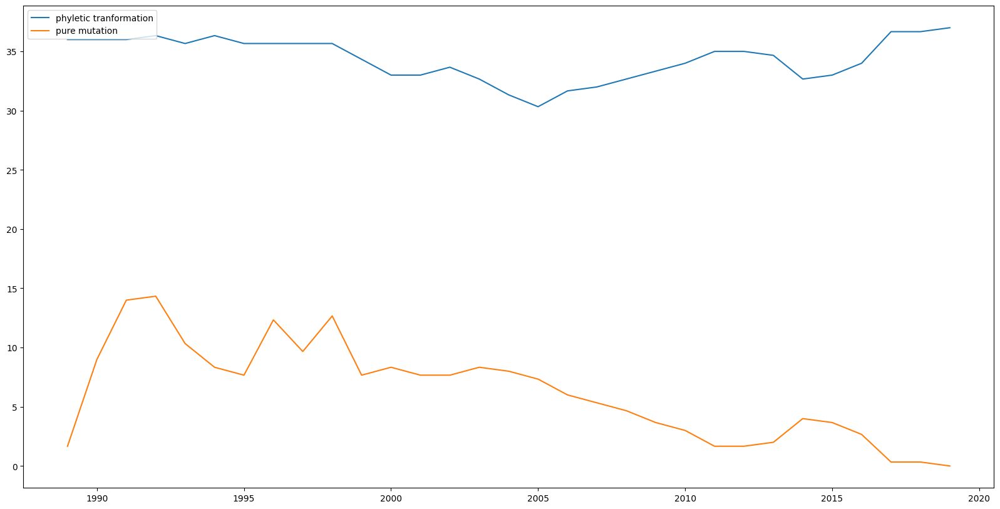

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]

for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_pure_mutation+=len(set(taxon.ancestor.products).difference(set(taxon.products)))
    temp_phyletic_transformation+=len(set(taxon.ancestor.products).intersection(set(taxon.products)))
  temp_pure_mutation_list.append(temp_pure_mutation)
  temp_phyletic_transformation_list.append(temp_phyletic_transformation)
  temp_total_list.append(temp_pure_mutation+temp_phyletic_transformation)

temp_smoothing_list_1=[]
temp_smoothing_list_2=[]

for i in range(3,len(year_list)-1):
  temp_smoothing_list_1.append(
      np.average(
      [temp_pure_mutation_list[i-2],
      temp_pure_mutation_list[i-1],
      temp_pure_mutation_list[i]]
  ))

  temp_smoothing_list_2.append(
      np.average(
      [temp_phyletic_transformation_list[i-2],
      temp_phyletic_transformation_list[i-1],
      temp_phyletic_transformation_list[i]]
  ))

fig=plt.figure(figsize=(20,10))
plt.plot(year_list[4:],temp_smoothing_list_2,label="phyletic tranformation")
plt.plot(year_list[4:],temp_smoothing_list_1,label="pure mutation")
#plt.plot(year_list[4:],temp_total_list,label="Total")

plt.legend(loc='upper left')

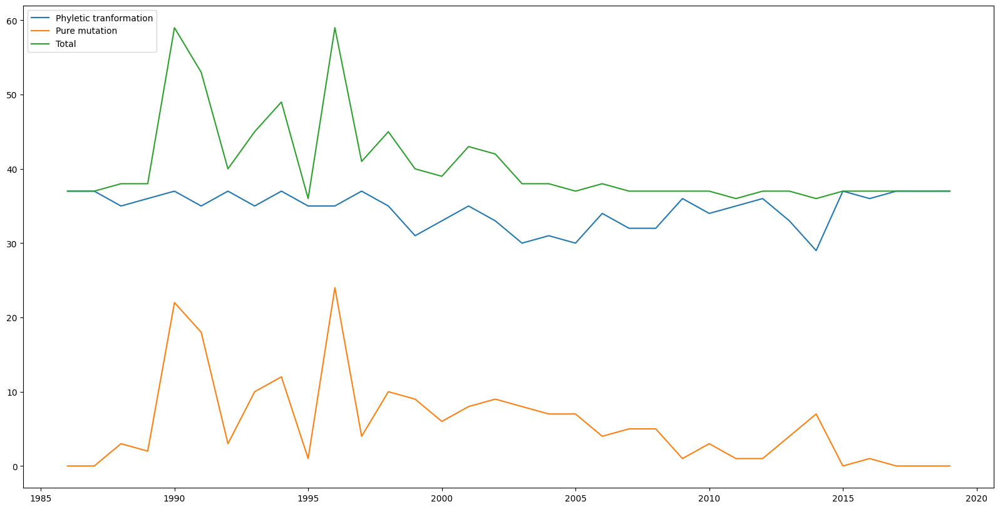

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_list_1.append(len(set(taxon.ancestor.products).difference(set(taxon.products))))
    temp_list_2.append(len(set(taxon.ancestor.products).intersection(set(taxon.products))))
  temp_pure_mutation_list.append(np.sum(temp_list_1))
  temp_phyletic_transformation_list.append(np.sum(temp_list_2))
  temp_total_list.append(np.sum(temp_list_1)+np.sum(temp_list_2))

fig=plt.figure(figsize=(20,10))
plt.plot(year_list[1:],temp_phyletic_transformation_list,label="Phyletic tranformation")
plt.plot(year_list[1:],temp_pure_mutation_list,label="Pure mutation")
plt.plot(year_list[1:],temp_total_list,label="Total")

plt.legend(loc='upper left')

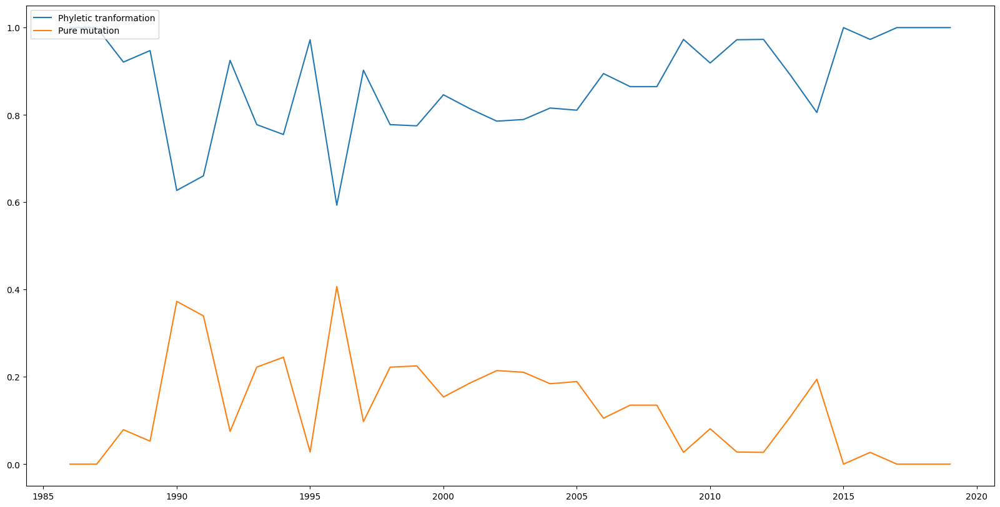

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_list_1.append(len(set(taxon.ancestor.products).difference(set(taxon.products))))
    temp_list_2.append(len(set(taxon.ancestor.products).intersection(set(taxon.products))))
  temp_pure_mutation_list.append(np.sum(temp_list_1)/(np.sum(temp_list_1)+np.sum(temp_list_2)))
  temp_phyletic_transformation_list.append(np.sum(temp_list_2)/(np.sum(temp_list_1)+np.sum(temp_list_2)))

fig=plt.figure(figsize=(20,10))
plt.plot(year_list[1:],temp_phyletic_transformation_list,label="Phyletic tranformation")
plt.plot(year_list[1:],temp_pure_mutation_list,label="Pure mutation")
#plt.plot(year_list[1:],[x/temp_total_list[temp_pure_mutation_list.index(x)] for x in temp_pure_mutation_list],label="Total")

#plt.plot(year_list[1:],temp_total_list,label="Total")

plt.legend(loc='upper left')

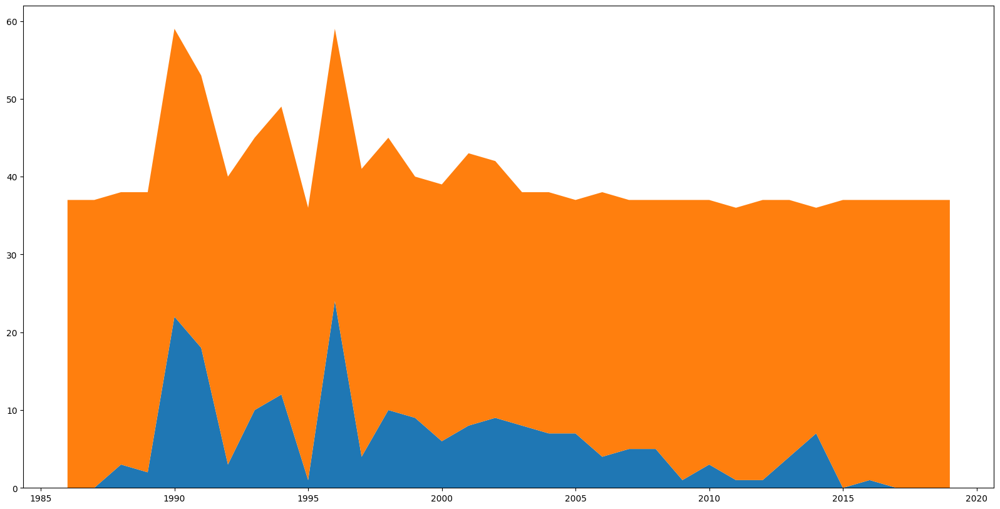

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_list_1.append(len(set(taxon.ancestor.products).difference(set(taxon.products))))
    temp_list_2.append(len(set(taxon.ancestor.products).intersection(set(taxon.products))))
  temp_pure_mutation_list.append(np.sum(temp_list_1))
  temp_phyletic_transformation_list.append(np.sum(temp_list_2))
  temp_total_list.append(np.sum(temp_list_1)+np.sum(temp_list_2))

fig=plt.figure(figsize=(20,10))
#plt.stackplot(year_list[1:],temp_phyletic_transformation_list)
#plt.stackplot(year_list[1:],temp_pure_mutation_list)
#plt.stackplot(year_list[1:],temp_total_list)

plt.stackplot(year_list[1:],temp_pure_mutation_list,temp_phyletic_transformation_list)
#plt.legend(loc='upper left')

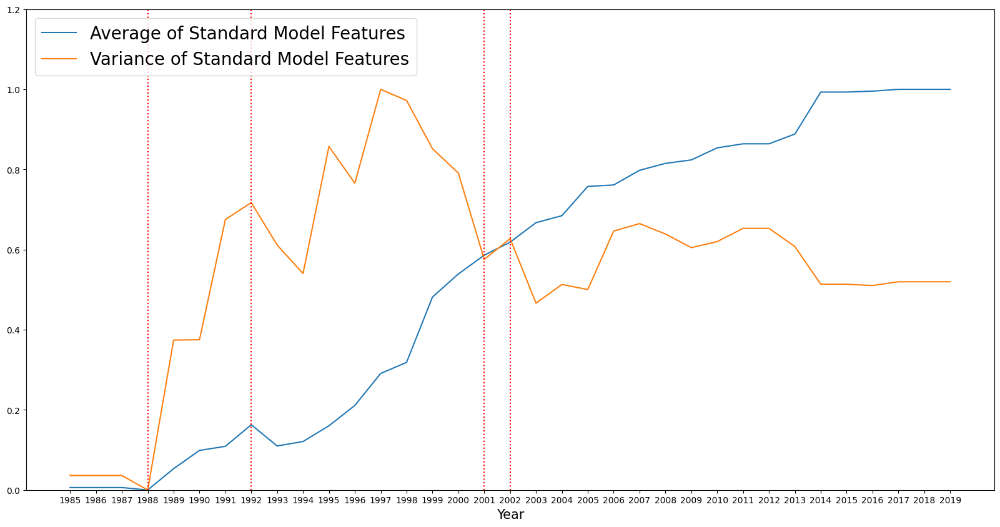

In [ ]:
year_list=[year for year in range(1985,2020)]
temp_text_value_1_list=[]
temp_text_value_2_list=[]

for year in year_list:
  temp_taxa=[np.sum(taxon.representative_vector) for taxon in Taxa_list if taxon.year==year]
  temp_text_value_1_list.append(np.average(temp_taxa))
  temp_text_value_2_list.append(np.var(temp_taxa))
  #temp_text_value_list.append(temp_text_value/37)

fig=plt.figure(figsize=(20,10))

plt.plot(year_list, minmax_scale(temp_text_value_1_list, axis=0, copy=True),label="Average of Standard Model Features")
plt.plot(year_list, minmax_scale(temp_text_value_2_list, axis=0, copy=True),label="Variance of Standard Model Features")

plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("")
plt.ylim([0,1.2])

plt.axvline(x=1988,color='red',linestyle="dotted")
plt.axvline(x=1992,color='red',linestyle="dotted")
plt.axvline(x=2001,color='red',linestyle="dotted")
plt.axvline(x=2002,color='red',linestyle="dotted")

plt.legend(loc='upper left',fontsize=20)
plt.savefig(output_directory+"/Description of Standard Model Features.jpg",dpi=300,transparent=True,bbox_inches="tight")

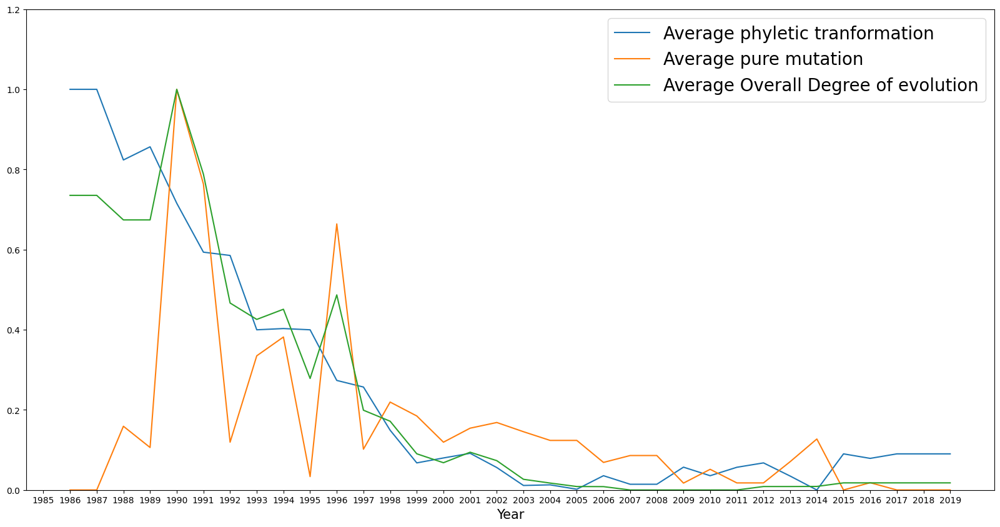

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_list_1.append(len(set(taxon.ancestor.products).difference(set(taxon.products))))
    temp_list_2.append(len(set(taxon.ancestor.products).intersection(set(taxon.products))))
  temp_pure_mutation_list.append(np.average(temp_list_1))
  temp_phyletic_transformation_list.append(np.average(temp_list_2))
  temp_total_list.append(np.average(temp_list_1+temp_list_2))

fig=plt.figure(figsize=(20,10))
plt.plot(year_list[1:],minmax_scale(temp_phyletic_transformation_list, axis=0, copy=True),label="Average phyletic tranformation")
plt.plot(year_list[1:],minmax_scale(temp_pure_mutation_list, axis=0, copy=True),label="Average pure mutation")
plt.plot(year_list[1:],minmax_scale(temp_total_list, axis=0, copy=True),label="Average Overall Degree of evolution")

plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("")
plt.ylim([0,1.2])

plt.legend(loc='upper right',fontsize=20)
plt.savefig(output_directory+"/Pure mutation phyletic transformation.jpg",dpi=300,transparent=True,bbox_inches="tight")

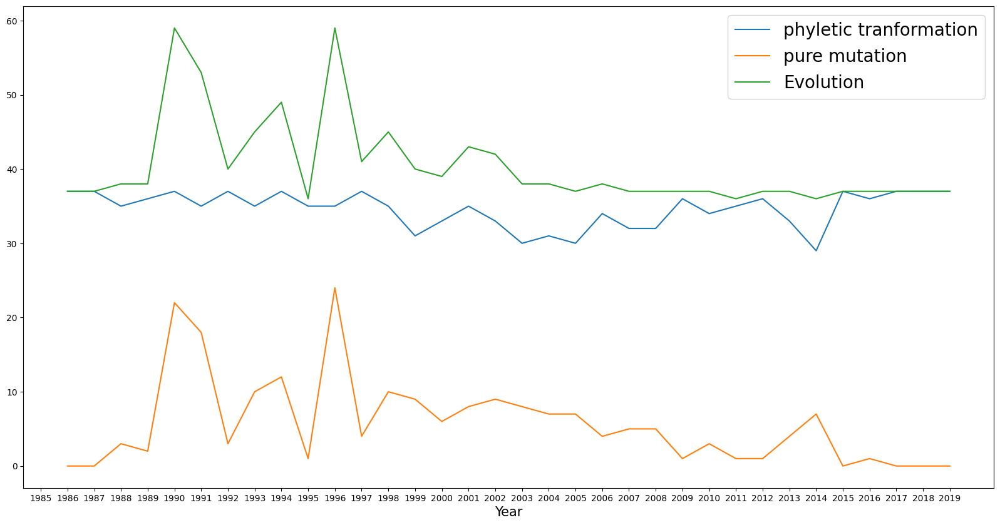

In [ ]:
temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_list_1.append(len(set(taxon.ancestor.products).difference(set(taxon.products))))
    temp_list_2.append(len(set(taxon.ancestor.products).intersection(set(taxon.products))))
  temp_pure_mutation_list.append(np.sum(temp_list_1))
  temp_phyletic_transformation_list.append(np.sum(temp_list_2))
  temp_total_list.append(np.sum(temp_list_1+temp_list_2))

fig=plt.figure(figsize=(20,10))
plt.plot(year_list[1:],temp_phyletic_transformation_list,label="phyletic tranformation")
plt.plot(year_list[1:],temp_pure_mutation_list,label="pure mutation")
plt.plot(year_list[1:],temp_total_list,label="Evolution")

plt.xticks(year_list)
plt.xlabel("Year",fontsize=15)
plt.ylabel("")
#plt.ylim([0,1.2])

plt.legend(loc='upper right',fontsize=20)
plt.savefig(output_directory+"/Total Pure mutation phyletic transformation.jpg",dpi=300,transparent=True,bbox_inches="tight")

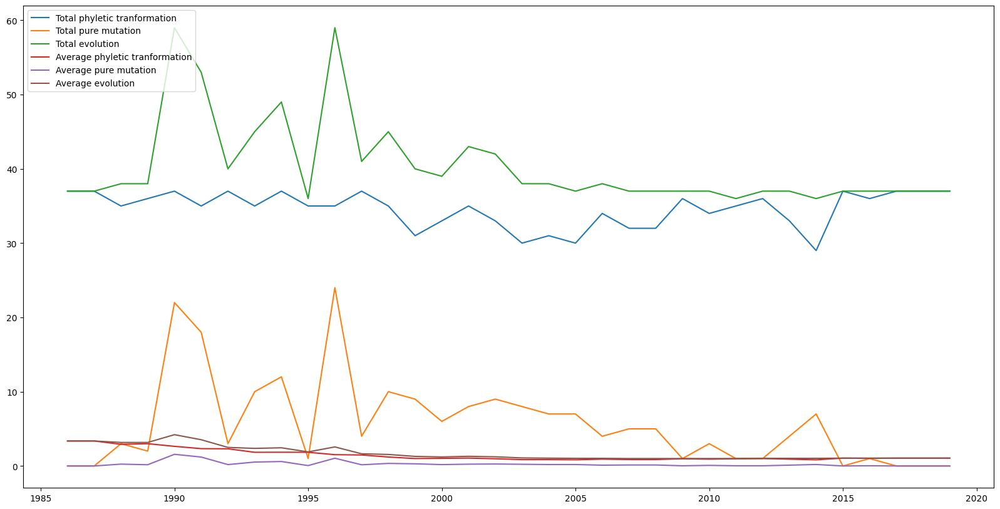

In [ ]:
fig=plt.figure(figsize=(20,10))

temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_pure_mutation+=len(set(taxon.ancestor.products).difference(set(taxon.products)))
    temp_phyletic_transformation+=len(set(taxon.ancestor.products).intersection(set(taxon.products)))
  temp_pure_mutation_list.append(temp_pure_mutation)
  temp_phyletic_transformation_list.append(temp_phyletic_transformation)
  temp_total_list.append(temp_pure_mutation+temp_phyletic_transformation)

plt.plot(year_list[1:],temp_phyletic_transformation_list,label="Total phyletic tranformation")
plt.plot(year_list[1:],temp_pure_mutation_list,label="Total pure mutation")
plt.plot(year_list[1:],temp_total_list,label="Total evolution")

temp_pure_mutation_list=[]
temp_phyletic_transformation_list=[]
temp_total_list=[]
for year in year_list[1:]:
  temp_list_1=[]
  temp_list_2=[]
  temp_taxa=[taxon for taxon in Taxa_list if taxon.year==year]
  temp_pure_mutation=0
  temp_phyletic_transformation=0
  for taxon in temp_taxa:
    temp_list_1.append(len(set(taxon.ancestor.products).difference(set(taxon.products))))
    temp_list_2.append(len(set(taxon.ancestor.products).intersection(set(taxon.products))))
  temp_pure_mutation_list.append(np.average(temp_list_1))
  temp_phyletic_transformation_list.append(np.average(temp_list_2))
  temp_total_list.append(np.average(temp_list_1)+np.average(temp_list_2))

plt.plot(year_list[1:],temp_phyletic_transformation_list,label="Average phyletic tranformation")
plt.plot(year_list[1:],temp_pure_mutation_list,label="Average pure mutation")
plt.plot(year_list[1:],temp_total_list,label="Average evolution")

plt.legend(loc='upper left')

In [ ]:
temp_reg_df=pd.DataFrame()
for temp_lineage in tqdm(list(paths_taxa_dict.keys())):
  for taxon in paths_taxa_dict[temp_lineage][1:]:
    temp_list=[]
    temp_list.append(taxon.year)
    # lineage
    temp_list.append(temp_lineage)

    # Pure Mutation_out 발생 수
    temp_list.append(len(
        set(taxon.ancestor.products).difference(set(taxon.products))
    ))


    # Phyletic Transformation 발생 수
    temp_list.append(len(
        set(taxon.products).intersection(set(taxon.ancestor.products))
    ))


    # t 시점의 계통적 관성
    temp_list.append(taxon.Inertia)


    # 계통 길이
    temp_list.append(len(paths_taxa_dict[temp_lineage][:paths_taxa_dict[temp_lineage].index(taxon)]))

    # t 시점의 생태적 압력
    temp_list.append(taxon.pressure)

    # t-1 시점의 생태적 압력
    #temp_list.append(Pressure(taxon.ancestor))

    temp_list.append(len(taxon.products))
    temp_list.append(len(taxon.ancestor.products))

    temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)

  0%|          | 0/35 [00:00<?, ?it/s]

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\3078037155.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)


In [ ]:
temp_reg_df.columns=["year","lineage","Pure_Mutation_out","Phyletic_Transformation","Inertia_t","length","Pressure_t","countries","ancestor_countries"]

In [ ]:
X=temp_reg_df[["Pure_Mutation_out",'Phyletic_Transformation',"Inertia_t","Pressure_t","length","ancestor_countries"]]
corr_matrix=np.corrcoef(X.T)
print(corr_matrix)

[[ 1.          0.02014496 -0.19429061  0.18197745 -0.15075437  0.41830924]
 [ 0.02014496  1.          0.34356982 -0.05607395 -0.37413328  0.91654718]
 [-0.19429061  0.34356982  1.         -0.11148995 -0.17481011  0.23441166]
 [ 0.18197745 -0.05607395 -0.11148995  1.         -0.42679311  0.02184983]
 [-0.15075437 -0.37413328 -0.17481011 -0.42679311  1.         -0.4001989 ]
 [ 0.41830924  0.91654718  0.23441166  0.02184983 -0.4001989   1.        ]]


In [ ]:
temp_reg_df["Inertia_t_2"]=[x*x for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pure_Mutation_out"]=[(x-np.mean(temp_reg_df["Pure_Mutation_out"]))/np.std(temp_reg_df["Pure_Mutation_out"]) for x in temp_reg_df["Pure_Mutation_out"]]
temp_reg_df["s_Phyletic_Transformation"]=[(x-np.mean(temp_reg_df["Phyletic_Transformation"]))/np.std(temp_reg_df["Phyletic_Transformation"]) for x in temp_reg_df["Phyletic_Transformation"]]
temp_reg_df["s_Inertia_t"]=[(x-np.mean(temp_reg_df["Inertia_t"]))/np.std(temp_reg_df["Inertia_t"]) for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pressure_t"]=[(x-np.mean(temp_reg_df["Pressure_t"]))/np.std(temp_reg_df["Pressure_t"]) for x in temp_reg_df["Pressure_t"]]
temp_reg_df["s_Inertia_t_2"]=[(x-np.mean(temp_reg_df["Inertia_t_2"]))/np.std(temp_reg_df["Inertia_t_2"]) for x in temp_reg_df["Inertia_t_2"]]
temp_reg_df["s_length"]=[(x-np.mean(temp_reg_df["length"]))/np.std(temp_reg_df["length"]) for x in temp_reg_df["length"]]
temp_reg_df["s_ancestor_countries"]=[(x-np.mean(temp_reg_df["ancestor_countries"]))/np.std(temp_reg_df["ancestor_countries"]) for x in temp_reg_df["ancestor_countries"]]

In [ ]:
md = smf.mixedlm("s_Pure_Mutation_out~  s_Inertia_t + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

              Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Pure_Mutation_out
No. Observations: 1190    Method:             REML               
No. Groups:       35      Scale:              0.6888             
Min. group size:  34      Log-Likelihood:     -1505.5384         
Max. group size:  34      Converged:          Yes                
Mean group size:  34.0                                           
-----------------------------------------------------------------
                      Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept              0.019    0.072   0.260 0.795 -0.123  0.161
s_Inertia_t           -0.493    0.040 -12.201 0.000 -0.572 -0.414
length                -0.001    0.003  -0.396 0.692 -0.006  0.004
s_ancestor_countries   0.566    0.031  18.168 0.000  0.505  0.627
Group Var              0.084    0.038                            



In [ ]:
md = smf.mixedlm("s_Pure_Mutation_out~  s_Inertia_t + s_Pressure_t + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

              Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Pure_Mutation_out
No. Observations: 1190    Method:             REML               
No. Groups:       35      Scale:              0.6794             
Min. group size:  34      Log-Likelihood:     -1495.0324         
Max. group size:  34      Converged:          Yes                
Mean group size:  34.0                                           
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept              -0.118    0.072 -1.639 0.101 -0.259  0.023
s_Inertia_t            -0.429    0.043 -9.901 0.000 -0.514 -0.344
s_Pressure_t            0.145    0.028  5.135 0.000  0.090  0.201
length                  0.007    0.003  2.177 0.030  0.001  0.013
s_ancestor_countries    0.574    0.031 18.326 0.000  0.513  0.636
Group Var               

In [ ]:
md = smf.mixedlm("s_Pure_Mutation_out~ s_Inertia_t + s_Pressure_t +s_Inertia_t_2 + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

              Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: s_Pure_Mutation_out
No. Observations:  1190    Method:             REML               
No. Groups:        35      Scale:              0.6527             
Min. group size:   34      Log-Likelihood:     -1472.5762         
Max. group size:   34      Converged:          Yes                
Mean group size:   34.0                                           
------------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------
Intercept             -0.323    0.081 -3.972 0.000  -0.482  -0.163
s_Inertia_t          -27.533    4.251 -6.476 0.000 -35.866 -19.200
s_Pressure_t           0.155    0.028  5.630 0.000   0.101   0.209
s_Inertia_t_2         27.119    4.254  6.375 0.000  18.782  35.457
length                 0.018    0.004  5.200 0.000   0.011   0.025
s_ancestor

In [ ]:
md = smf.mixedlm("s_Phyletic_Transformation~ s_Inertia_t + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Phyletic_Transformation
No. Observations: 1190    Method:             REML                     
No. Groups:       35      Scale:              0.1335                   
Min. group size:  34      Log-Likelihood:     -532.6639                
Max. group size:  34      Converged:          Yes                      
Mean group size:  34.0                                                 
------------------------------------------------------------------------
                         Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
------------------------------------------------------------------------
Intercept                -0.008     0.032  -0.260  0.795  -0.071   0.054
s_Inertia_t               0.217     0.018  12.201  0.000   0.182   0.252
length                    0.000     0.001   0.396  0.692  -0.002   0.003
s_ancestor_countries      0.852     0.014  62.142  0.000   0.825   0.879
Gr

In [ ]:
md = smf.mixedlm("s_Phyletic_Transformation~ s_Inertia_t + s_Pressure_t + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Phyletic_Transformation
No. Observations: 1190    Method:             REML                     
No. Groups:       35      Scale:              0.1317                   
Min. group size:  34      Log-Likelihood:     -522.9783                
Max. group size:  34      Converged:          Yes                      
Mean group size:  34.0                                                 
------------------------------------------------------------------------
                         Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
------------------------------------------------------------------------
Intercept                 0.052     0.032   1.639  0.101  -0.010   0.114
s_Inertia_t               0.189     0.019   9.901  0.000   0.152   0.226
s_Pressure_t             -0.064     0.012  -5.135  0.000  -0.088  -0.040
length                   -0.003     0.001  -2.177  0.030  -0.006  -0.000
s_

In [ ]:
md = smf.mixedlm("s_Phyletic_Transformation~ s_Inertia_t + s_Pressure_t +s_Inertia_t_2 + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Phyletic_Transformation
No. Observations: 1190    Method:             REML                     
No. Groups:       35      Scale:              0.1265                   
Min. group size:  34      Log-Likelihood:     -501.3423                
Max. group size:  34      Converged:          Yes                      
Mean group size:  34.0                                                 
------------------------------------------------------------------------
                        Coef.   Std.Err.    z     P>|z|   [0.025  0.975]
------------------------------------------------------------------------
Intercept                0.142     0.036   3.972  0.000    0.072   0.212
s_Inertia_t             12.123     1.872   6.476  0.000    8.454  15.792
s_Pressure_t            -0.068     0.012  -5.630  0.000   -0.092  -0.045
s_Inertia_t_2          -11.941     1.873  -6.375  0.000  -15.612  -8.270
le

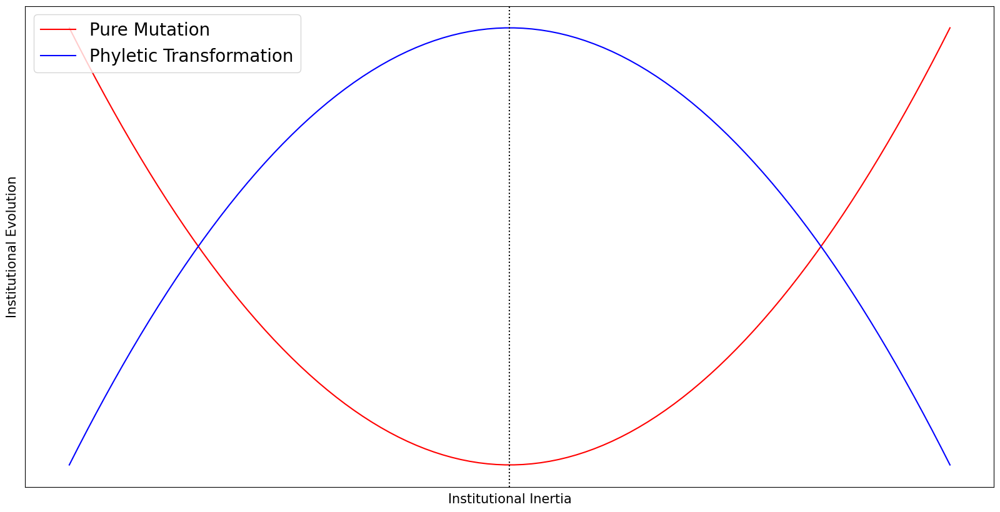

In [ ]:
from sympy import *
import sympy as sy

fig=plt.figure(figsize=(20,10))

X=np.linspace(0,4,100)
plt.plot(X,(X-2)*(X-2),color='Red',label="Pure Mutation")
plt.plot(X,(-X+2)*(X-2)+4,color='Blue',label="Phyletic Transformation")

plt.xlabel("Institutional Inertia",fontsize=15)
plt.ylabel("Institutional Evolution",fontsize=15)

plt.xticks([])
plt.yticks([])
plt.legend(loc="upper left",fontsize=20)

plt.axvline(x=2,color='black',linestyle='dotted')

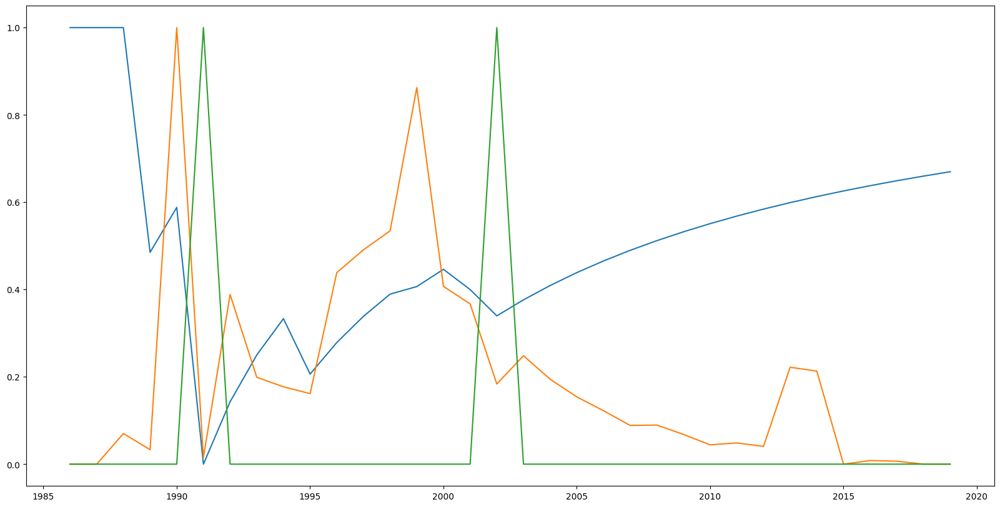

In [ ]:
temp_year_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['year'])
temp_inertia_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['Inertia_t'])
temp_pressure_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['Pressure_t'])
temp_pure_mutation_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['Pure_Mutation_out'])

fig=plt.figure(figsize=(20,10))

plt.plot(temp_year_list,minmax_scale(temp_inertia_list, axis=0, copy=True))
plt.plot(temp_year_list,minmax_scale(temp_pressure_list, axis=0, copy=True))
plt.plot(temp_year_list,minmax_scale(temp_pure_mutation_list, axis=0, copy=True))


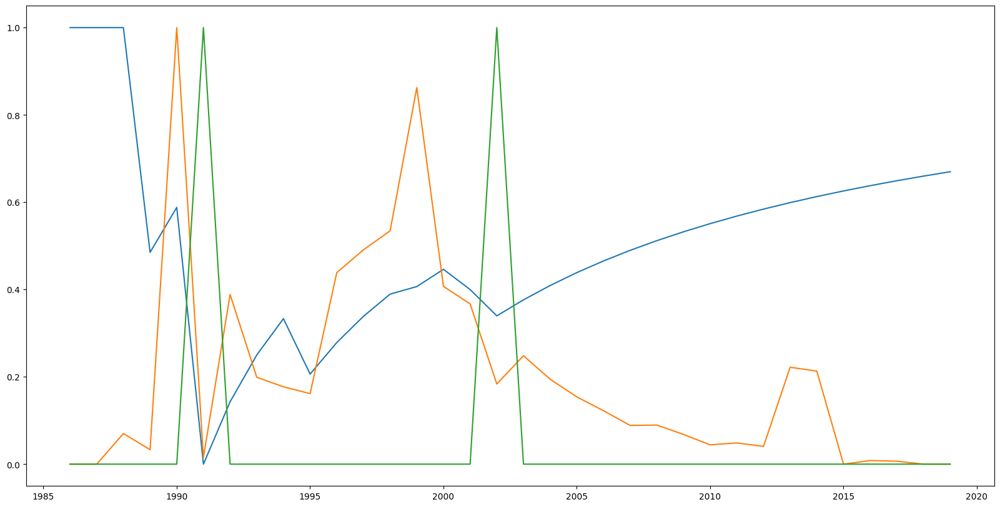

In [ ]:
temp_year_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['year'])
temp_inertia_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['Inertia_t'])
temp_pressure_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['Pressure_t'])
temp_pure_mutation_list=list(temp_reg_df[temp_reg_df["lineage"]=='taxon 1']['Pure_Mutation_out'])

fig=plt.figure(figsize=(20,10))

plt.plot(temp_year_list,minmax_scale(temp_inertia_list, axis=0, copy=True))
plt.plot(temp_year_list,minmax_scale(temp_pressure_list, axis=0, copy=True))
plt.plot(temp_year_list,minmax_scale(temp_pure_mutation_list, axis=0, copy=True))


C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\2677451956.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(20,10))


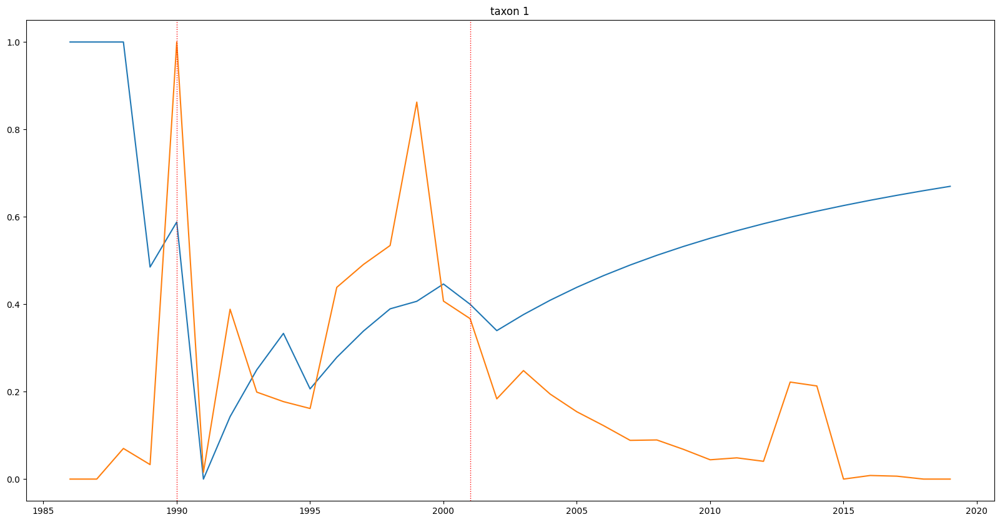

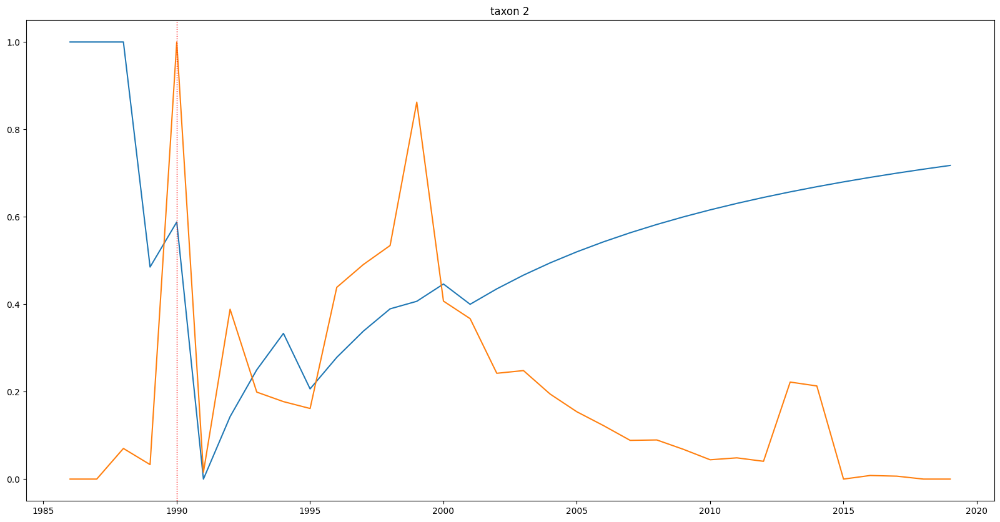

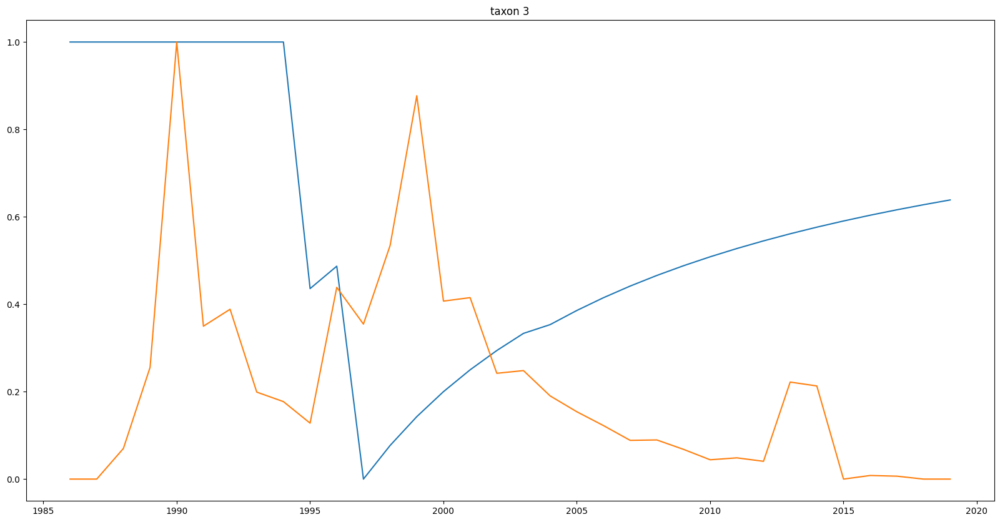

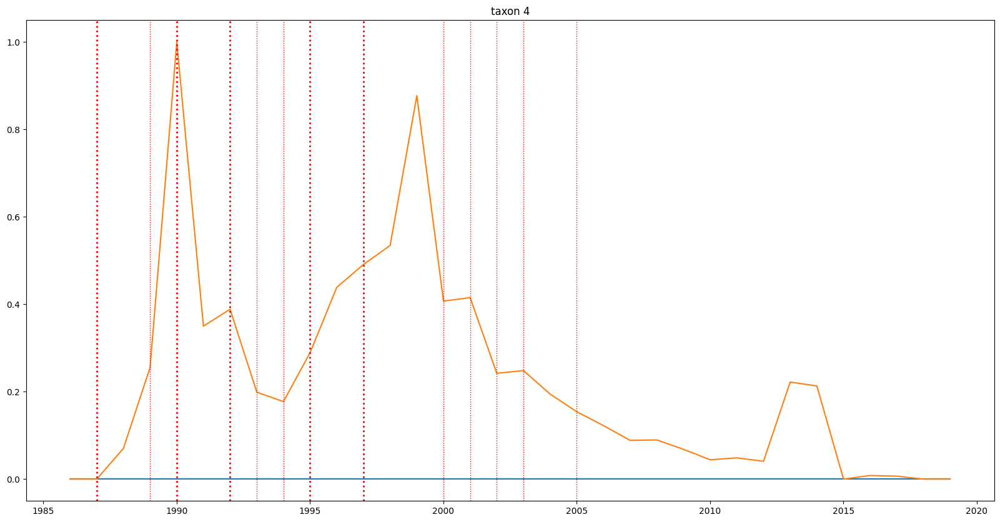

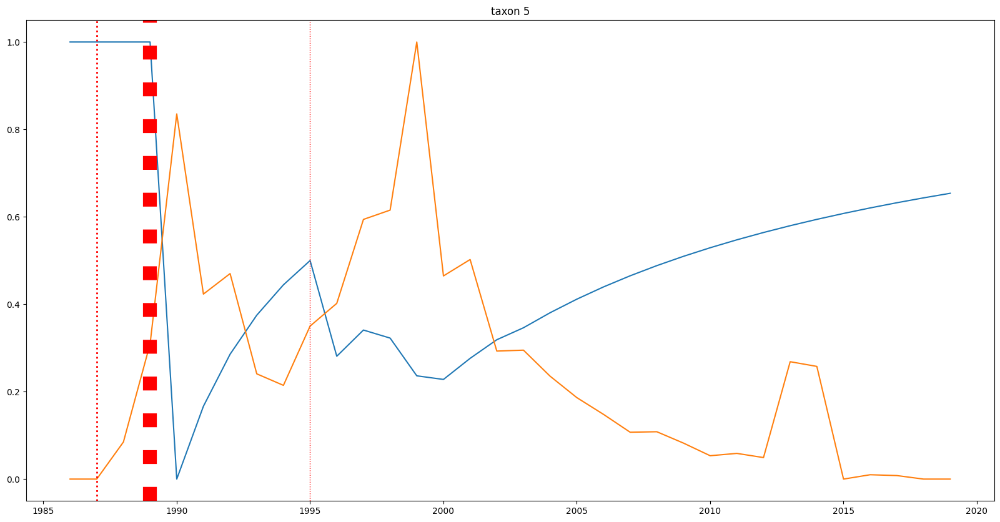

...

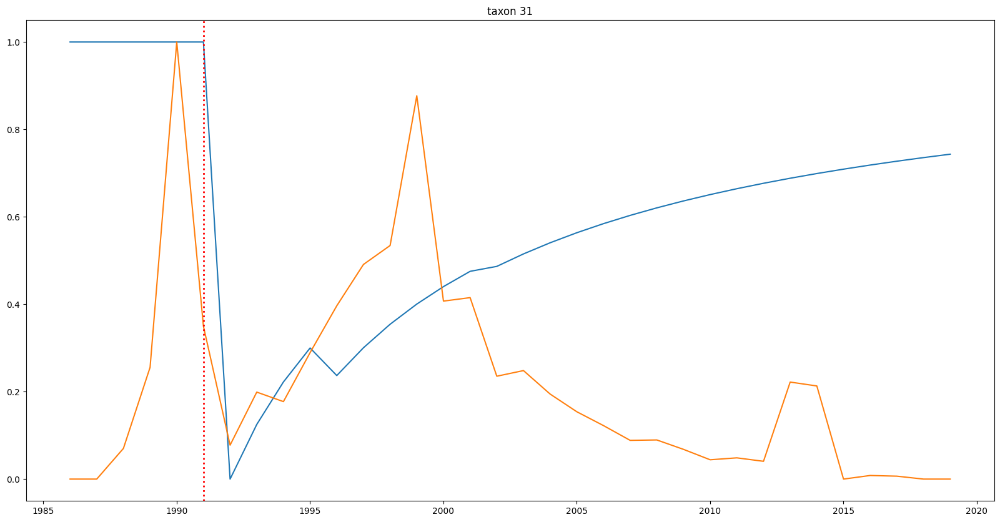

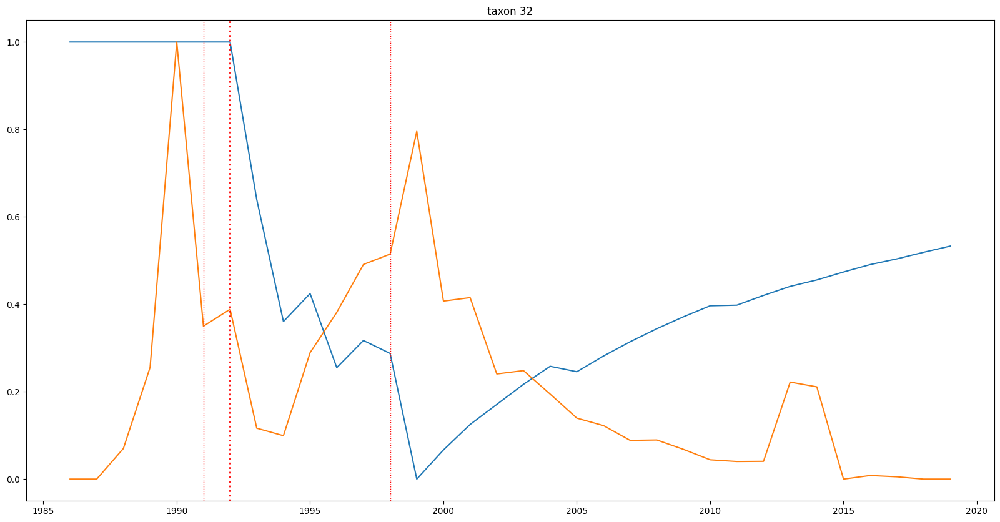

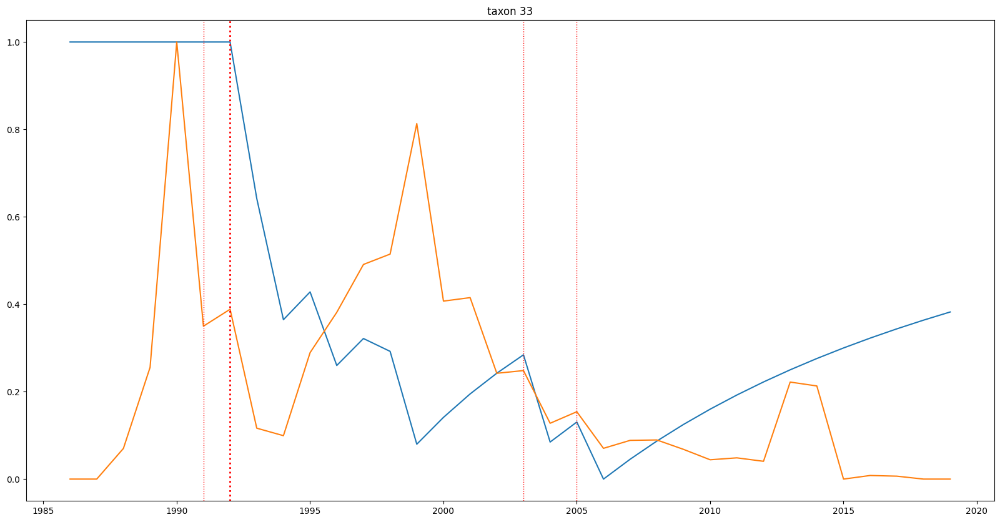

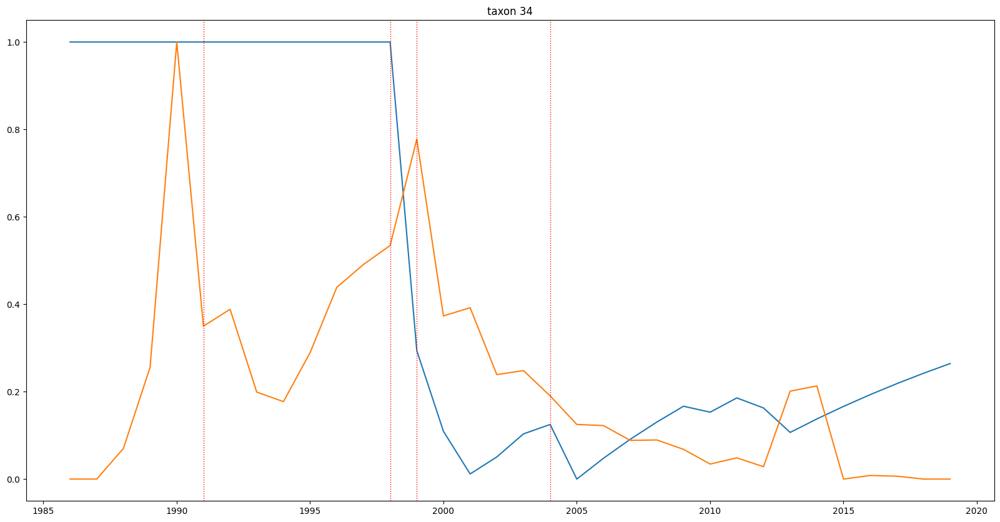

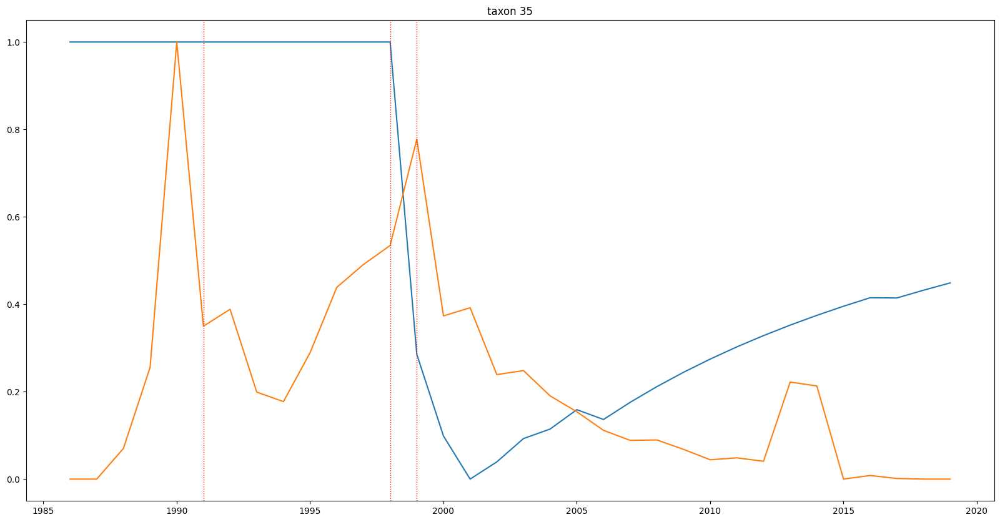

In [ ]:
temp_taxon_name_list=['taxon %s'%(i) for i in range(1,36)]

for temp_taxon_name in temp_taxon_name_list:

  temp_year_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['year'])
  temp_inertia_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['Inertia_t'])
  temp_pressure_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['Pressure_t'])
  temp_pure_mutation_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['Pure_Mutation_out'])

  fig=plt.figure(figsize=(20,10))

  plt.plot(temp_year_list,minmax_scale(temp_inertia_list, axis=0, copy=True))
  plt.plot(temp_year_list,minmax_scale(temp_pressure_list, axis=0, copy=True))
  #plt.plot(temp_year_list,minmax_scale(temp_pure_mutation_list, axis=0, copy=True))

  for i in range(len(temp_pure_mutation_list)):
    if temp_pure_mutation_list[i]!=0:
      plt.axvline(x=year_list[i],color='red',linestyle='dotted',linewidth=int(temp_pure_mutation_list[i]))

  plt.title(temp_taxon_name)


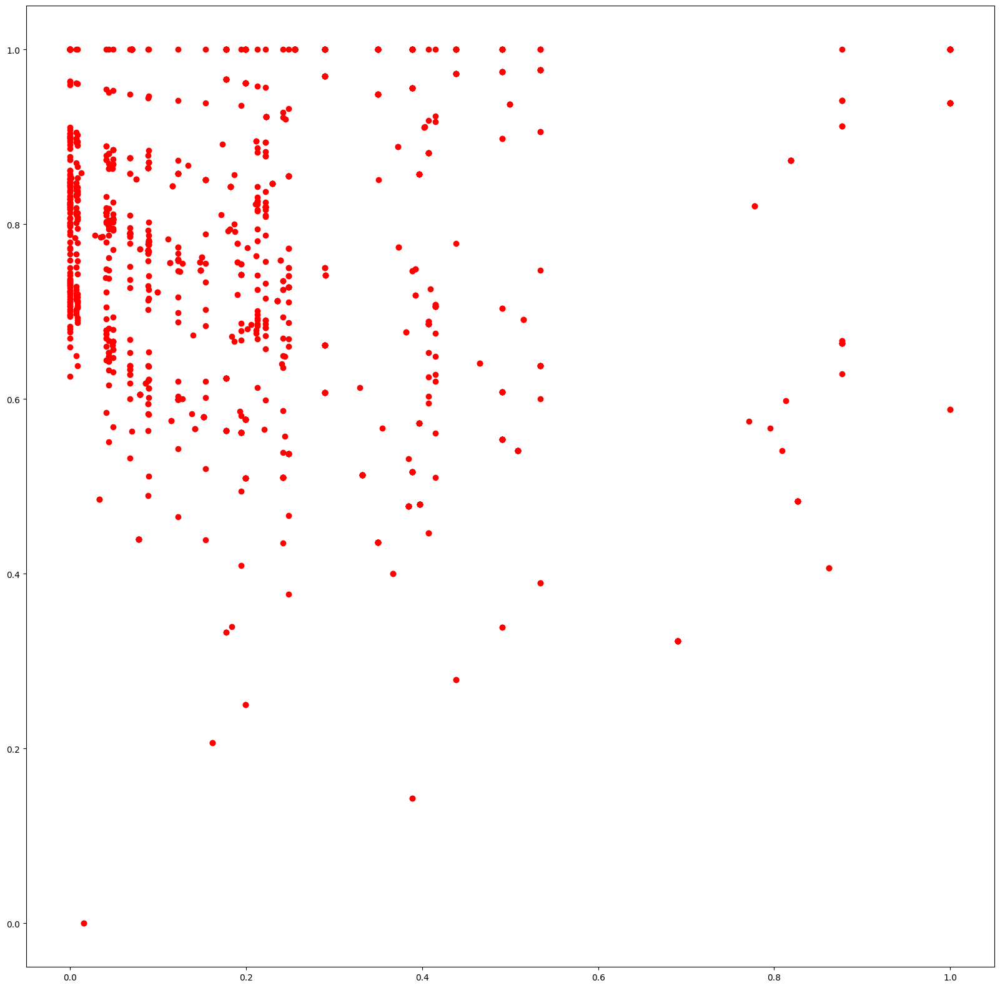

In [ ]:
temp_year_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['year'])
temp_inertia_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['Inertia_t'])
temp_pressure_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['Pressure_t'])
temp_pure_mutation_list=list(temp_reg_df[temp_reg_df["lineage"]==temp_taxon_name]['Pure_Mutation_out'])

fig=plt.figure(figsize=(20,20))

#plt.scatter(list(temp_reg_df["s_Pure_Mutation_out"]),minmax_scale(list(temp_reg_df["Inertia_t"]), axis=0, copy=True),color='red')
plt.scatter(minmax_scale(list(temp_reg_df["Pressure_t"]), axis=0, copy=True),minmax_scale(list(temp_reg_df["Inertia_t"]), axis=0, copy=True),color='red')
#plt.scatter(minmax_scale(list(temp_reg_df["Pure_Mutation_out"]), axis=0, copy=True),minmax_scale(list(temp_reg_df["Inertia_t_2"]), axis=0, copy=True),color='blue')
#plt.scatter(minmax_scale(list(temp_reg_df["Pure_Mutation_out"]), axis=0, copy=True),minmax_scale(list(temp_reg_df["Pressure_t"]), axis=0, copy=True),color='green')

In [ ]:
# input taxon
def IIN_Regime(input_taxon,input_range):
  temp_taxon=input_taxon
  temp_list=[]
  #while temp_taxon.ancestor:
  while True:
    temp_weight_dict=weight_dict[temp_taxon.year-1]
    temp_list.append(weighted_similarity(temp_taxon.ancestor.representative_vector,temp_taxon.representative_vector,temp_weight_dict))
    temp_taxon=temp_taxon.ancestor
    if len(temp_list)==input_range:
      break
    if not temp_taxon.ancestor:
      break

  return np.average(temp_list)

In [ ]:
for taxon in tqdm(Taxa_list):
  if taxon.year>1985:
    taxon.Inertia=IIN_Regime(taxon,100)
    taxon.pressure=Pressure(taxon)

  0%|          | 0/977 [00:00<?, ?it/s]

In [ ]:
temp_reg_df=pd.DataFrame()
for temp_lineage in tqdm(list(paths_taxa_dict.keys())):
  for taxon in paths_taxa_dict[temp_lineage][1:]:
    temp_list=[]
    temp_list.append(taxon.year)
    # lineage
    temp_list.append(temp_lineage)

    # Pure Mutation_out 발생 수
    temp_list.append(len(
        set(taxon.ancestor.products).difference(set(taxon.products))
    ))


    # Phyletic Transformation 발생 수
    temp_list.append(len(
        set(taxon.products).intersection(set(taxon.ancestor.products))
    ))


    # t 시점의 계통적 관성
    temp_list.append(taxon.Inertia)


    # 계통 길이
    temp_list.append(len(paths_taxa_dict[temp_lineage][:paths_taxa_dict[temp_lineage].index(taxon)]))

    # t 시점의 생태적 압력
    temp_list.append(taxon.pressure)

    # t-1 시점의 생태적 압력
    #temp_list.append(Pressure(taxon.ancestor))

    temp_list.append(len(taxon.products))
    temp_list.append(len(taxon.ancestor.products))

    temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)

temp_reg_df.columns=["year","lineage","Pure_Mutation_out","Phyletic_Transformation","Inertia_t","length","Pressure_t","countries","ancestor_countries"]

temp_reg_df["Inertia_t_2"]=[x*x for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pure_Mutation_out"]=[(x-np.mean(temp_reg_df["Pure_Mutation_out"]))/np.std(temp_reg_df["Pure_Mutation_out"]) for x in temp_reg_df["Pure_Mutation_out"]]
temp_reg_df["s_Phyletic_Transformation"]=[(x-np.mean(temp_reg_df["Phyletic_Transformation"]))/np.std(temp_reg_df["Phyletic_Transformation"]) for x in temp_reg_df["Phyletic_Transformation"]]
temp_reg_df["s_Inertia_t"]=[(x-np.mean(temp_reg_df["Inertia_t"]))/np.std(temp_reg_df["Inertia_t"]) for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pressure_t"]=[(x-np.mean(temp_reg_df["Pressure_t"]))/np.std(temp_reg_df["Pressure_t"]) for x in temp_reg_df["Pressure_t"]]
temp_reg_df["s_Inertia_t_2"]=[(x-np.mean(temp_reg_df["Inertia_t_2"]))/np.std(temp_reg_df["Inertia_t_2"]) for x in temp_reg_df["Inertia_t_2"]]
temp_reg_df["s_length"]=[(x-np.mean(temp_reg_df["length"]))/np.std(temp_reg_df["length"]) for x in temp_reg_df["length"]]
temp_reg_df["s_ancestor_countries"]=[(x-np.mean(temp_reg_df["ancestor_countries"]))/np.std(temp_reg_df["ancestor_countries"]) for x in temp_reg_df["ancestor_countries"]]

  0%|          | 0/35 [00:00<?, ?it/s]

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\269913657.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)


In [ ]:
md = smf.mixedlm("s_Pure_Mutation_out~ s_Inertia_t + s_Pressure_t +s_Inertia_t_2 + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())


              Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: s_Pure_Mutation_out
No. Observations:  1190    Method:             REML               
No. Groups:        35      Scale:              0.6527             
Min. group size:   34      Log-Likelihood:     -1472.5762         
Max. group size:   34      Converged:          Yes                
Mean group size:   34.0                                           
------------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------
Intercept             -0.323    0.081 -3.972 0.000  -0.482  -0.163
s_Inertia_t          -27.533    4.251 -6.476 0.000 -35.866 -19.200
s_Pressure_t           0.155    0.028  5.630 0.000   0.101   0.209
s_Inertia_t_2         27.119    4.254  6.375 0.000  18.782  35.457
length                 0.018    0.004  5.200 0.000   0.011   0.025
s_ancestor

In [ ]:

md = smf.mixedlm("s_Phyletic_Transformation~ s_Inertia_t + s_Pressure_t +s_Inertia_t_2 + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Phyletic_Transformation
No. Observations: 1190    Method:             REML                     
No. Groups:       35      Scale:              0.1265                   
Min. group size:  34      Log-Likelihood:     -501.3423                
Max. group size:  34      Converged:          Yes                      
Mean group size:  34.0                                                 
------------------------------------------------------------------------
                        Coef.   Std.Err.    z     P>|z|   [0.025  0.975]
------------------------------------------------------------------------
Intercept                0.142     0.036   3.972  0.000    0.072   0.212
s_Inertia_t             12.123     1.872   6.476  0.000    8.454  15.792
s_Pressure_t            -0.068     0.012  -5.630  0.000   -0.092  -0.045
s_Inertia_t_2          -11.941     1.873  -6.375  0.000  -15.612  -8.270
le

In [ ]:
for taxon in tqdm(Taxa_list):
  if taxon.year>1985:
    taxon.Inertia=IIN_Regime(taxon,2)
    #taxon.pressure=Pressure(taxon)

  0%|          | 0/977 [00:00<?, ?it/s]

In [ ]:
temp_reg_df=pd.DataFrame()
for temp_lineage in tqdm(list(paths_taxa_dict.keys())):
  for taxon in paths_taxa_dict[temp_lineage][1:]:
    temp_list=[]
    temp_list.append(taxon.year)
    # lineage
    temp_list.append(temp_lineage)

    # Pure Mutation_out 발생 수
    temp_list.append(len(
        set(taxon.ancestor.products).difference(set(taxon.products))
    ))


    # Phyletic Transformation 발생 수
    temp_list.append(len(
        set(taxon.products).intersection(set(taxon.ancestor.products))
    ))


    # t 시점의 계통적 관성
    temp_list.append(taxon.Inertia)


    # 계통 길이
    temp_list.append(len(paths_taxa_dict[temp_lineage][:paths_taxa_dict[temp_lineage].index(taxon)]))

    # t 시점의 생태적 압력
    temp_list.append(taxon.pressure)

    # t-1 시점의 생태적 압력
    #temp_list.append(Pressure(taxon.ancestor))

    temp_list.append(len(taxon.products))
    temp_list.append(len(taxon.ancestor.products))

    temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)

temp_reg_df.columns=["year","lineage","Pure_Mutation_out","Phyletic_Transformation","Inertia_t","length","Pressure_t","countries","ancestor_countries"]

temp_reg_df["Inertia_t_2"]=[x*x for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pure_Mutation_out"]=[(x-np.mean(temp_reg_df["Pure_Mutation_out"]))/np.std(temp_reg_df["Pure_Mutation_out"]) for x in temp_reg_df["Pure_Mutation_out"]]
temp_reg_df["s_Phyletic_Transformation"]=[(x-np.mean(temp_reg_df["Phyletic_Transformation"]))/np.std(temp_reg_df["Phyletic_Transformation"]) for x in temp_reg_df["Phyletic_Transformation"]]
temp_reg_df["s_Inertia_t"]=[(x-np.mean(temp_reg_df["Inertia_t"]))/np.std(temp_reg_df["Inertia_t"]) for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pressure_t"]=[(x-np.mean(temp_reg_df["Pressure_t"]))/np.std(temp_reg_df["Pressure_t"]) for x in temp_reg_df["Pressure_t"]]
temp_reg_df["s_Inertia_t_2"]=[(x-np.mean(temp_reg_df["Inertia_t_2"]))/np.std(temp_reg_df["Inertia_t_2"]) for x in temp_reg_df["Inertia_t_2"]]
temp_reg_df["s_length"]=[(x-np.mean(temp_reg_df["length"]))/np.std(temp_reg_df["length"]) for x in temp_reg_df["length"]]
temp_reg_df["s_ancestor_countries"]=[(x-np.mean(temp_reg_df["ancestor_countries"]))/np.std(temp_reg_df["ancestor_countries"]) for x in temp_reg_df["ancestor_countries"]]

  0%|          | 0/35 [00:00<?, ?it/s]

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\269913657.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)


In [ ]:
md = smf.mixedlm("s_Pure_Mutation_out~ s_Inertia_t + s_Pressure_t + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

              Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Pure_Mutation_out
No. Observations: 1190    Method:             REML               
No. Groups:       35      Scale:              0.6796             
Min. group size:  34      Log-Likelihood:     -1472.3017         
Max. group size:  34      Converged:          Yes                
Mean group size:  34.0                                           
-----------------------------------------------------------------
                      Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept             -0.304    0.057  -5.312 0.000 -0.417 -0.192
s_Inertia_t           -0.344    0.025 -13.665 0.000 -0.393 -0.295
s_Pressure_t           0.140    0.028   5.081 0.000  0.086  0.194
length                 0.017    0.003   5.844 0.000  0.012  0.023
s_ancestor_countries   0.476    0.025  18.776 0.000  0.426  0.526
Group Var              0

c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [ ]:
md = smf.mixedlm("s_Pure_Mutation_out~ s_Inertia_t + s_Pressure_t +s_Inertia_t_2 + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

              Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Pure_Mutation_out
No. Observations: 1190    Method:             REML               
No. Groups:       35      Scale:              0.6756             
Min. group size:  34      Log-Likelihood:     -1467.1418         
Max. group size:  34      Converged:          Yes                
Mean group size:  34.0                                           
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept              -0.317    0.057 -5.554 0.000 -0.429 -0.205
s_Inertia_t            -4.055    1.296 -3.129 0.002 -6.595 -1.515
s_Pressure_t            0.161    0.028  5.671 0.000  0.105  0.217
s_Inertia_t_2           3.716    1.298  2.864 0.004  1.173  6.260
length                  0.018    0.003  6.111 0.000  0.012  0.024
s_ancestor_countries    

c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [ ]:
md = smf.mixedlm("s_Phyletic_Transformation~ s_Inertia_t + s_Pressure_t + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Phyletic_Transformation
No. Observations: 1190    Method:             REML                     
No. Groups:       35      Scale:              0.1317                   
Min. group size:  34      Log-Likelihood:     -500.2476                
Max. group size:  34      Converged:          Yes                      
Mean group size:  34.0                                                 
------------------------------------------------------------------------
                         Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
------------------------------------------------------------------------
Intercept                 0.134     0.025   5.312  0.000   0.085   0.183
s_Inertia_t               0.151     0.011  13.665  0.000   0.130   0.173
s_Pressure_t             -0.062     0.012  -5.081  0.000  -0.086  -0.038
length                   -0.008     0.001  -5.844  0.000  -0.010  -0.005
s_

c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [ ]:
md = smf.mixedlm("s_Phyletic_Transformation~ s_Inertia_t + s_Pressure_t +s_Inertia_t_2 + length + s_ancestor_countries ", temp_reg_df, groups=temp_reg_df["lineage"])
mdf = md.fit()
print(mdf.summary())

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: s_Phyletic_Transformation
No. Observations: 1190    Method:             REML                     
No. Groups:       35      Scale:              0.1310                   
Min. group size:  34      Log-Likelihood:     -495.9079                
Max. group size:  34      Converged:          Yes                      
Mean group size:  34.0                                                 
------------------------------------------------------------------------
                         Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
------------------------------------------------------------------------
Intercept                 0.140     0.025   5.554  0.000   0.090   0.189
s_Inertia_t               1.785     0.571   3.129  0.002   0.667   2.904
s_Pressure_t             -0.071     0.012  -5.671  0.000  -0.095  -0.046
s_Inertia_t_2            -1.636     0.571  -2.864  0.004  -2.756  -0.516
le

c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\jdwoo\miniconda3\envs\newenv\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [ ]:
for taxon in tqdm(Taxa_list):
  if taxon.year>1985:
    taxon.Inertia=IIN_Regime(taxon,3)
    #taxon.pressure=Pressure(taxon)

  0%|          | 0/977 [00:00<?, ?it/s]

In [ ]:
temp_reg_df=pd.DataFrame()
for temp_lineage in tqdm(list(paths_taxa_dict.keys())):
  for taxon in paths_taxa_dict[temp_lineage][1:]:
    temp_list=[]
    temp_list.append(taxon.year)
    # lineage
    temp_list.append(temp_lineage)

    # Pure Mutation_out 발생 수
    temp_list.append(len(
        set(taxon.ancestor.products).difference(set(taxon.products))
    ))


    # Phyletic Transformation 발생 수
    temp_list.append(len(
        set(taxon.products).intersection(set(taxon.ancestor.products))
    ))


    # t 시점의 계통적 관성
    temp_list.append(taxon.Inertia)


    # 계통 길이
    temp_list.append(len(paths_taxa_dict[temp_lineage][:paths_taxa_dict[temp_lineage].index(taxon)]))

    # t 시점의 생태적 압력
    temp_list.append(taxon.pressure)

    # t-1 시점의 생태적 압력
    #temp_list.append(Pressure(taxon.ancestor))

    temp_list.append(len(taxon.products))
    temp_list.append(len(taxon.ancestor.products))

    temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)

temp_reg_df.columns=["year","lineage","Pure_Mutation_out","Phyletic_Transformation","Inertia_t","length","Pressure_t","countries","ancestor_countries"]

temp_reg_df["Inertia_t_2"]=[x*x for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pure_Mutation_out"]=[(x-np.mean(temp_reg_df["Pure_Mutation_out"]))/np.std(temp_reg_df["Pure_Mutation_out"]) for x in temp_reg_df["Pure_Mutation_out"]]
temp_reg_df["s_Phyletic_Transformation"]=[(x-np.mean(temp_reg_df["Phyletic_Transformation"]))/np.std(temp_reg_df["Phyletic_Transformation"]) for x in temp_reg_df["Phyletic_Transformation"]]
temp_reg_df["s_Inertia_t"]=[(x-np.mean(temp_reg_df["Inertia_t"]))/np.std(temp_reg_df["Inertia_t"]) for x in temp_reg_df["Inertia_t"]]
temp_reg_df["s_Pressure_t"]=[(x-np.mean(temp_reg_df["Pressure_t"]))/np.std(temp_reg_df["Pressure_t"]) for x in temp_reg_df["Pressure_t"]]
temp_reg_df["s_Inertia_t_2"]=[(x-np.mean(temp_reg_df["Inertia_t_2"]))/np.std(temp_reg_df["Inertia_t_2"]) for x in temp_reg_df["Inertia_t_2"]]
temp_reg_df["s_length"]=[(x-np.mean(temp_reg_df["length"]))/np.std(temp_reg_df["length"]) for x in temp_reg_df["length"]]
temp_reg_df["s_ancestor_countries"]=[(x-np.mean(temp_reg_df["ancestor_countries"]))/np.std(temp_reg_df["ancestor_countries"]) for x in temp_reg_df["ancestor_countries"]]

  0%|          | 0/35 [00:00<?, ?it/s]

C:\Users\jdwoo\AppData\Local\Temp\ipykernel_21660\269913657.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_reg_df=temp_reg_df.append(pd.Series(temp_list),ignore_index=True)
